In [0]:
# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive',  force_remount=True)

Mounted at /content/drive


In [0]:
!ls /content/drive/My\ Drive/Data_WGAN

mnist.zip


In [0]:
!apt-get install pvimport torch
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

Reading package lists... Done
Building dependency tree       
Reading state information... Done
E: Unable to locate package pvimport
E: Unable to locate package torch


In [0]:
!pv drive/My\ Drive/Data_WGAN/mnist.zip > /content/mnist.zip

14.6MiB 0:00:00 [ 402MiB/s] [================================>] 100%            


In [0]:
!unzip -q /content/mnist.zip

replace mnist.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n


In [0]:
import torch
import torch.nn
import torch.nn.functional as nn
import torch.autograd as autograd
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import torchvision
import matplotlib.gridspec as gridspec
import os
from torch.autograd import Variable
from tensorflow.examples.tutorials.mnist import input_data
import os
os.chdir('/content/')

In [0]:
%matplotlib inline

In [0]:
mnist = input_data.read_data_sets('../../MNIST_data', one_hot=True)
# mb_size = 32
# z_dim = 10
# X_dim = mnist.train.images.shape[1]
# y_dim = mnist.train.labels.shape[1]
# h_dim = 128
# cnt = 0
# lr = 1e-4
# mnist = dset.ImageFolder('/content',
#                            transform=transforms.Compose([
#                                transforms.Resize(mb_size),
#                                transforms.CenterCrop(mb_size),
#                                transforms.ToTensor(),
#                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
#                            ]))


Extracting ../../MNIST_data/train-images-idx3-ubyte.gz
Extracting ../../MNIST_data/train-labels-idx1-ubyte.gz
Extracting ../../MNIST_data/t10k-images-idx3-ubyte.gz
Extracting ../../MNIST_data/t10k-labels-idx1-ubyte.gz


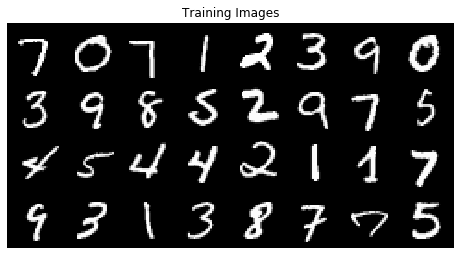

In [0]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
train_loader = torch.utils.data.DataLoader(
  torchvision.datasets.MNIST('/files/', train=True, download=True,
                             transform=torchvision.transforms.Compose([
                               torchvision.transforms.ToTensor(),
                               torchvision.transforms.Normalize(
                                 (0.1307,), (0.3081,))
                             ])),
  batch_size=32, shuffle=True)


# Create the dataloader
# dataloader = torch.utils.data.DataLoader(mnist.train.images, batch_size=32,
#                                          shuffle=True, num_workers=2)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(train_loader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [0]:
mnist = input_data.read_data_sets('../../MNIST_data', one_hot=True)
mb_size = 32
z_dim = 10
X_dim = mnist.train.images.shape[1]
y_dim = mnist.train.labels.shape[1]
h_dim = 128
cnt = 0
lr = 1e-4

# Create the Generator
G = torch.nn.Sequential(
    torch.nn.Linear(z_dim, h_dim),
    torch.nn.ReLU(),
    torch.nn.Linear(h_dim, X_dim),
    torch.nn.Sigmoid()
)

# Create the discriminator
D = torch.nn.Sequential(
    torch.nn.Linear(X_dim, h_dim),
    torch.nn.ReLU(),
    torch.nn.Linear(h_dim, 1),
)


def reset_grad():
    G.zero_grad()
    D.zero_grad()


G_solver = optim.RMSprop(G.parameters(), lr=lr)
D_solver = optim.RMSprop(D.parameters(), lr=lr)


Extracting ../../MNIST_data/train-images-idx3-ubyte.gz
Extracting ../../MNIST_data/train-labels-idx1-ubyte.gz
Extracting ../../MNIST_data/t10k-images-idx3-ubyte.gz
Extracting ../../MNIST_data/t10k-labels-idx1-ubyte.gz


Iter-0; D_loss: -0.011466704308986664; G_loss: -0.02484995499253273


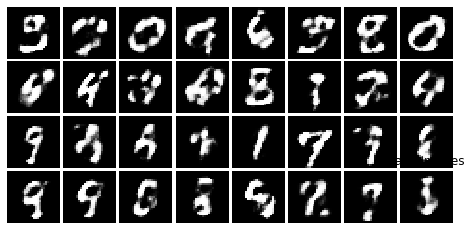

<Figure size 432x288 with 0 Axes>

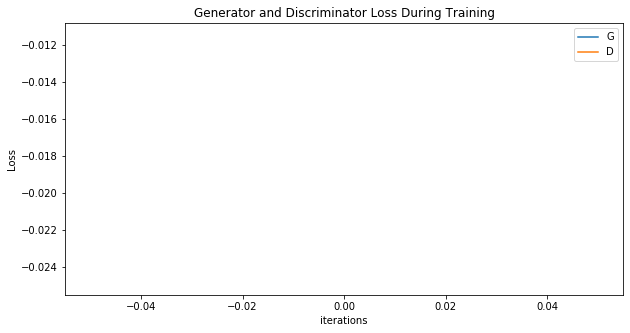

Iter-1000; D_loss: -0.013116462156176567; G_loss: -0.022725490853190422


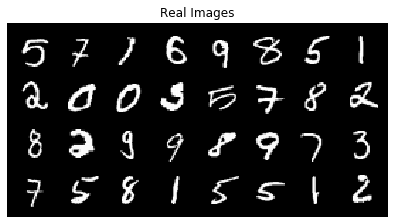

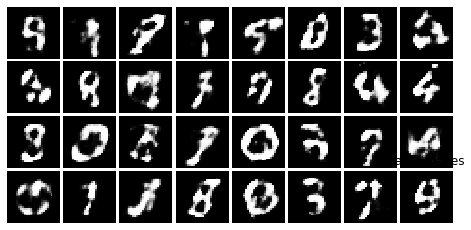

<Figure size 432x288 with 0 Axes>

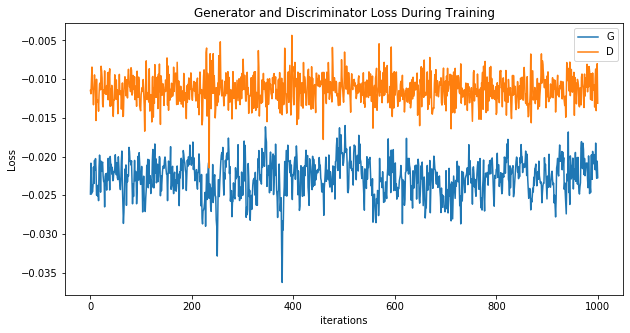

Iter-2000; D_loss: -0.012603193521499634; G_loss: -0.023009223863482475


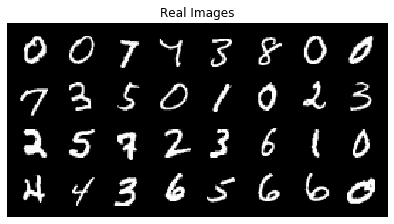

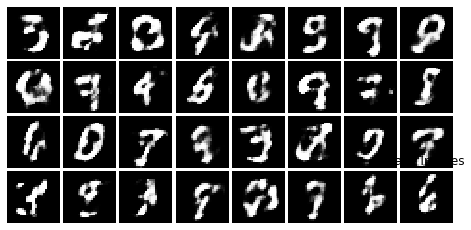

<Figure size 432x288 with 0 Axes>

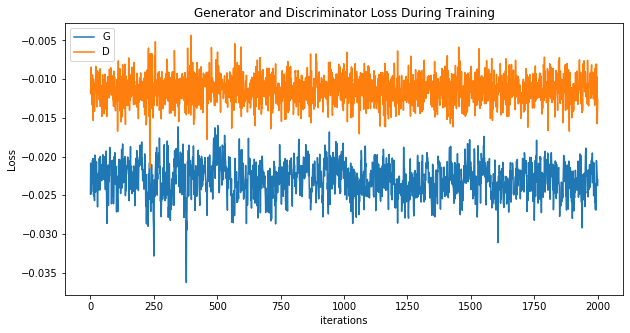

Iter-3000; D_loss: -0.012492384761571884; G_loss: -0.021408306434750557


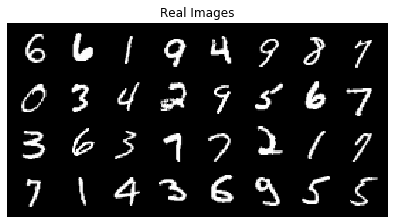

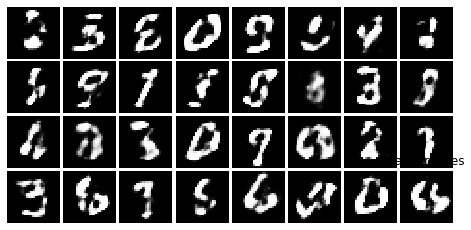

<Figure size 432x288 with 0 Axes>

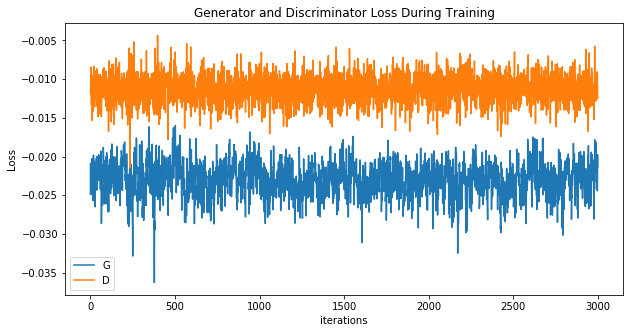

Iter-4000; D_loss: -0.0137193463742733; G_loss: -0.025184281170368195


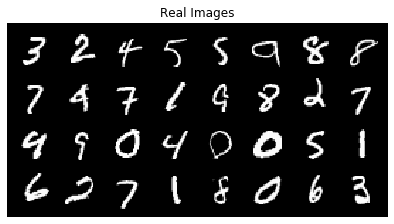

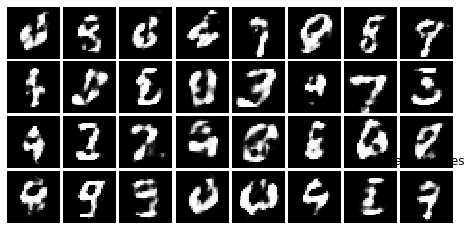

<Figure size 432x288 with 0 Axes>

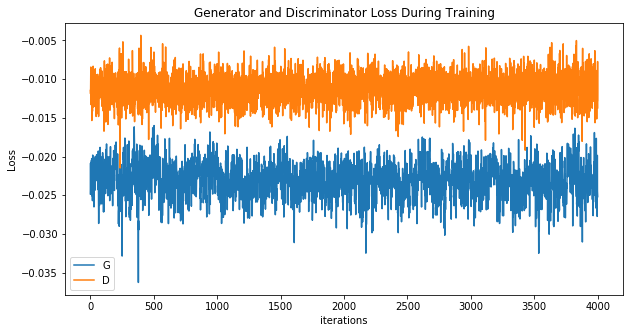

Iter-5000; D_loss: -0.007438290864229202; G_loss: -0.021374894306063652


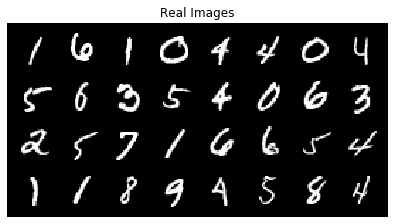

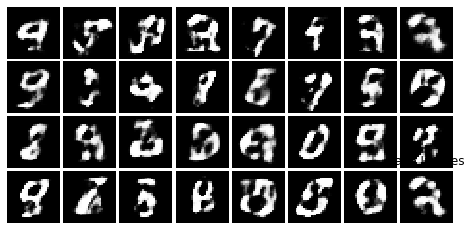

<Figure size 432x288 with 0 Axes>

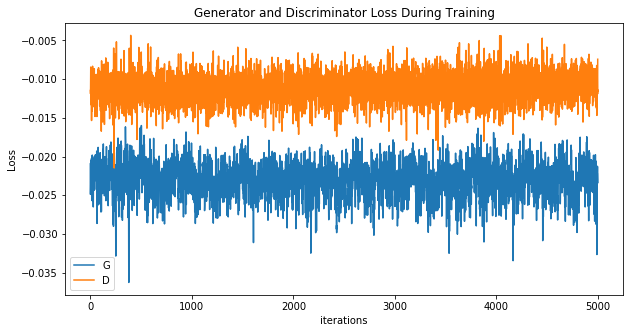

Iter-6000; D_loss: -0.011950833722949028; G_loss: -0.020737282931804657


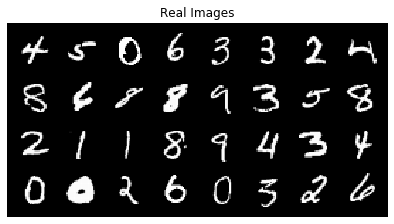

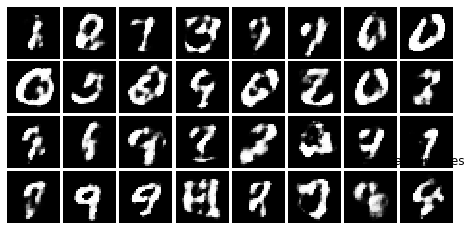

<Figure size 432x288 with 0 Axes>

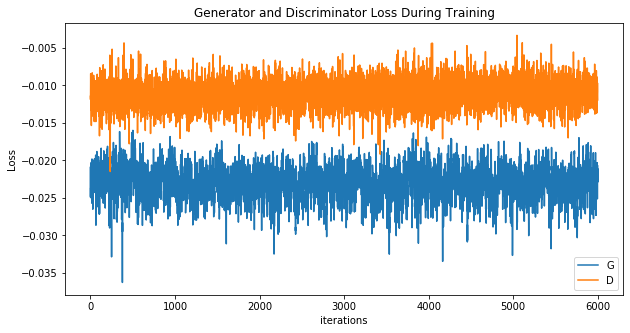

Iter-7000; D_loss: -0.01089535653591156; G_loss: -0.024434879422187805


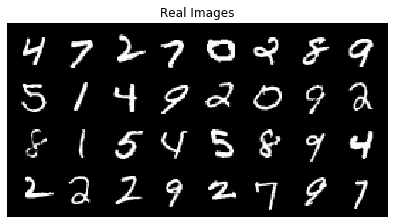

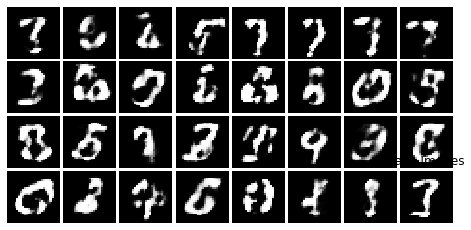

<Figure size 432x288 with 0 Axes>

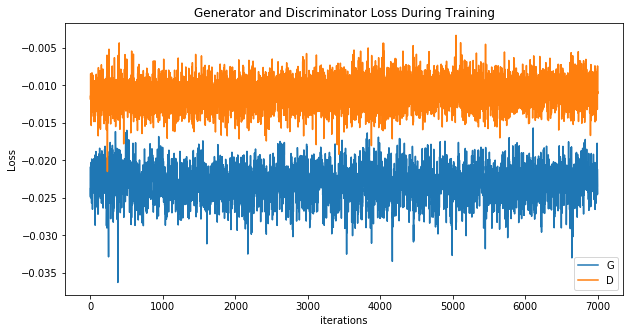

Iter-8000; D_loss: -0.011202523484826088; G_loss: -0.023695504292845726


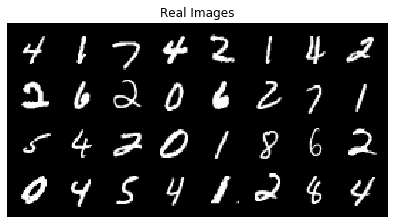

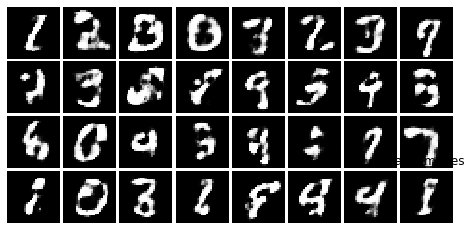

<Figure size 432x288 with 0 Axes>

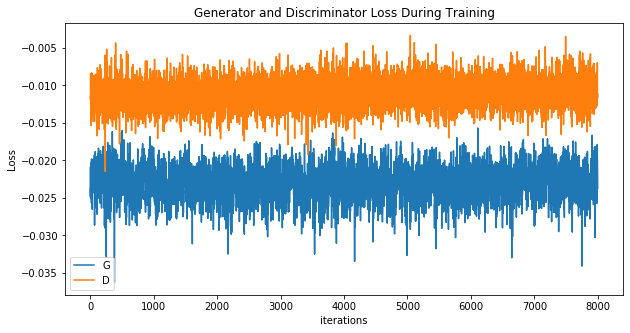

Iter-9000; D_loss: -0.009442251175642014; G_loss: -0.023224186152219772


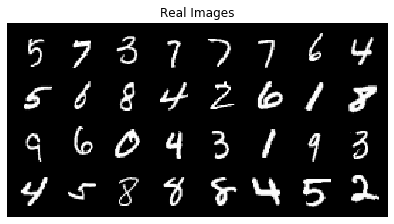

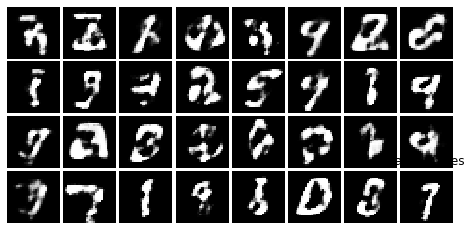

<Figure size 432x288 with 0 Axes>

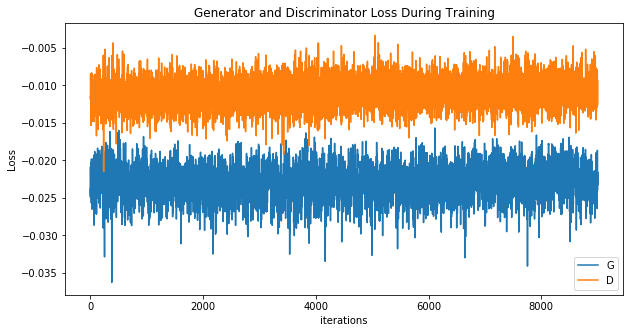

Iter-10000; D_loss: -0.010939022526144981; G_loss: -0.022813189774751663


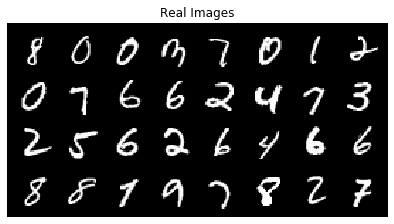

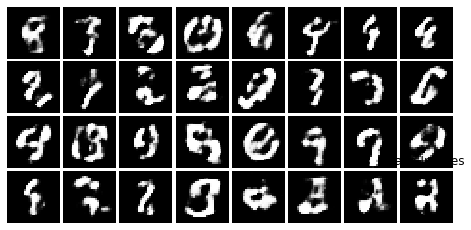

<Figure size 432x288 with 0 Axes>

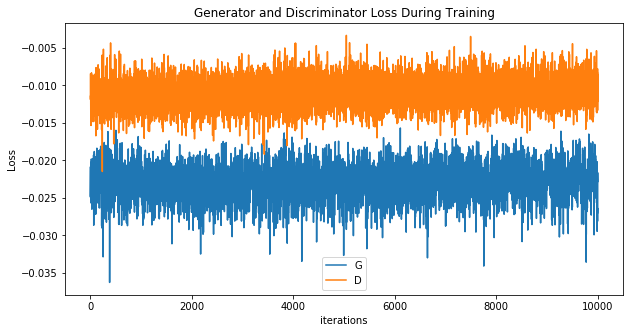

Iter-11000; D_loss: -0.008040651679039001; G_loss: -0.023835713043808937


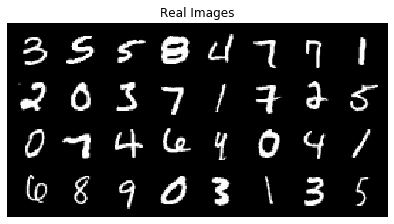

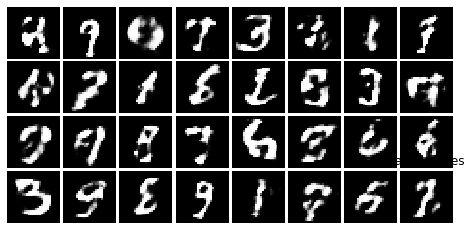

<Figure size 432x288 with 0 Axes>

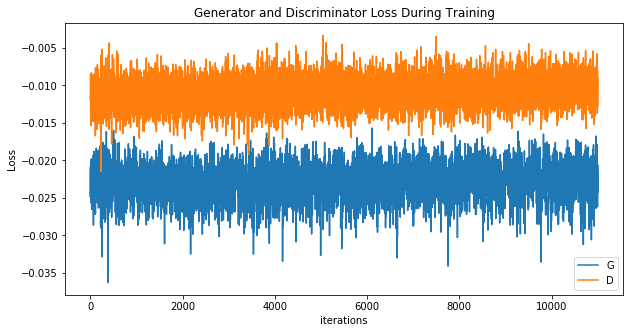

Iter-12000; D_loss: -0.008017947897315025; G_loss: -0.020627586171030998


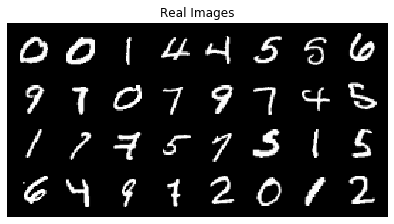

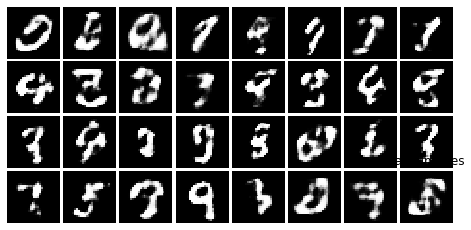

<Figure size 432x288 with 0 Axes>

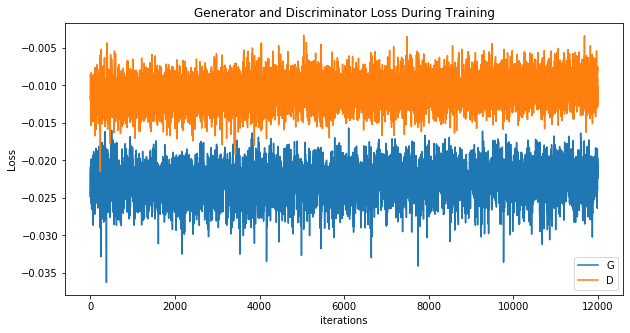

Iter-13000; D_loss: -0.010825643315911293; G_loss: -0.02207122929394245


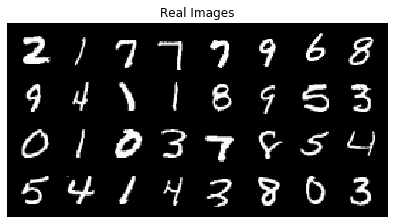

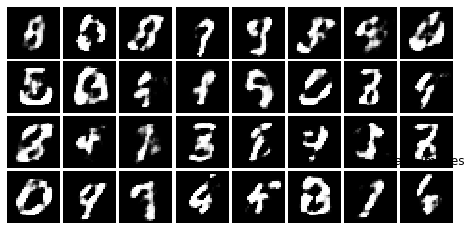

<Figure size 432x288 with 0 Axes>

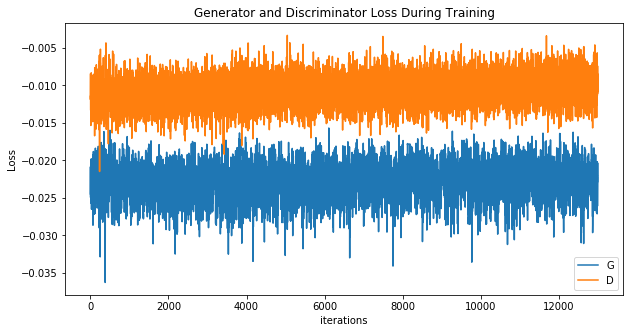

Iter-14000; D_loss: -0.0116793904453516; G_loss: -0.025182250887155533


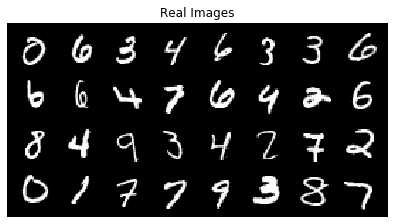

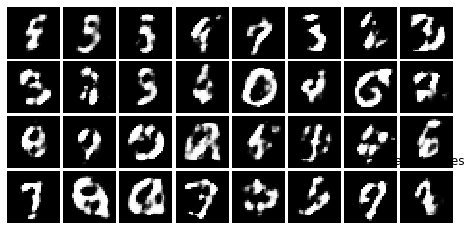

<Figure size 432x288 with 0 Axes>

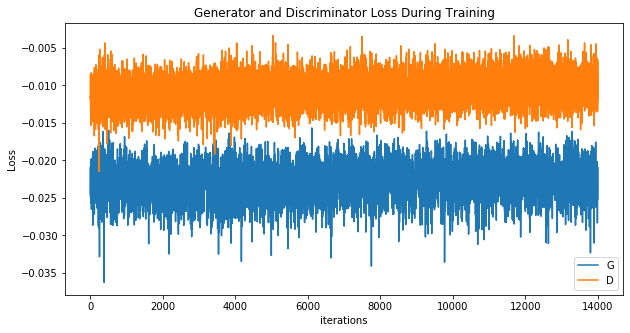

Iter-15000; D_loss: -0.008928615599870682; G_loss: -0.021027732640504837


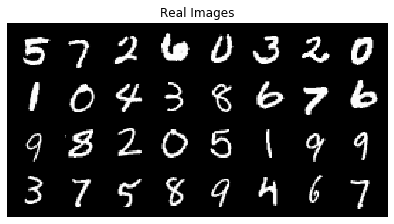

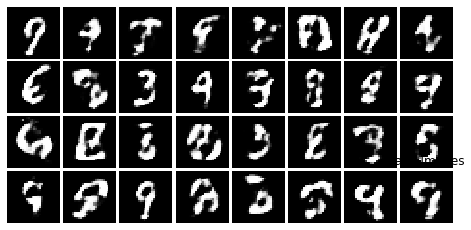

<Figure size 432x288 with 0 Axes>

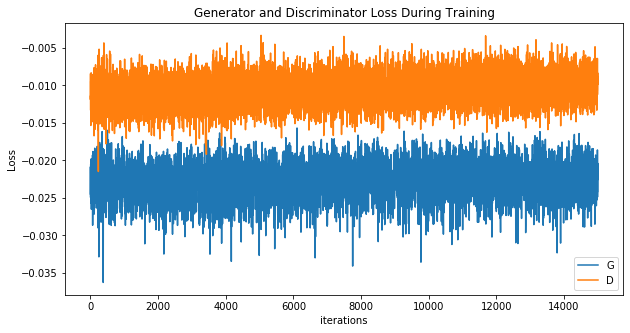

Iter-16000; D_loss: -0.008992515504360199; G_loss: -0.02351468801498413


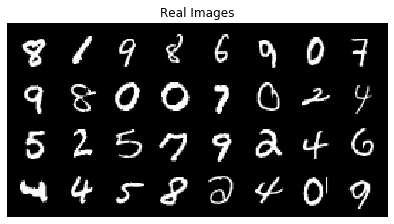

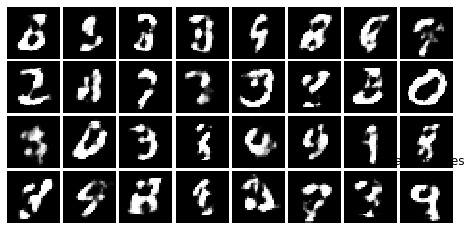

<Figure size 432x288 with 0 Axes>

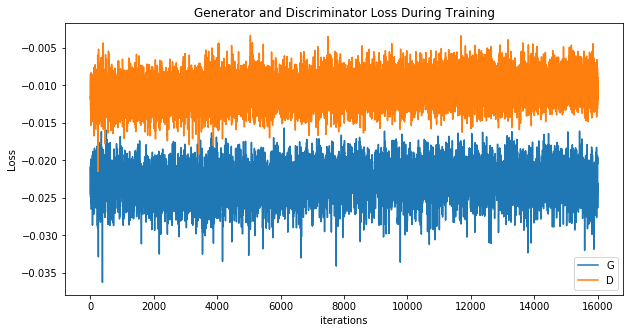

Iter-17000; D_loss: -0.012153899297118187; G_loss: -0.022947043180465698


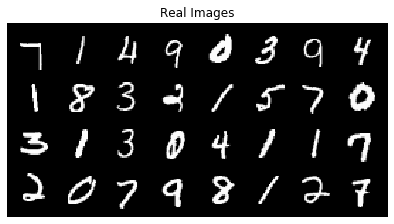

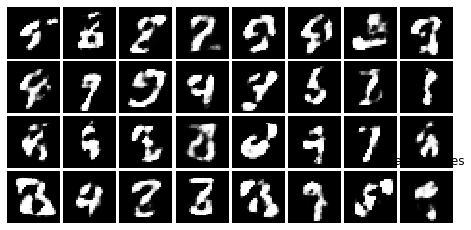

<Figure size 432x288 with 0 Axes>

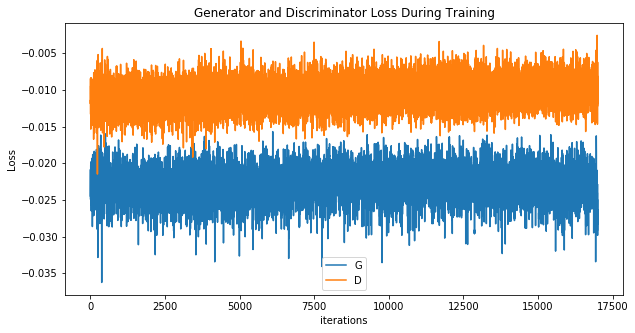

Iter-18000; D_loss: -0.008050339296460152; G_loss: -0.020266495645046234


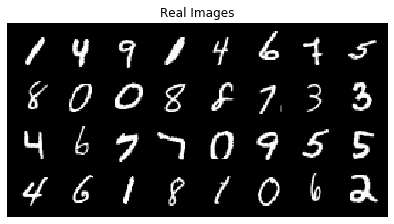

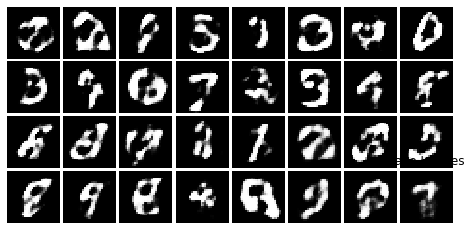

<Figure size 432x288 with 0 Axes>

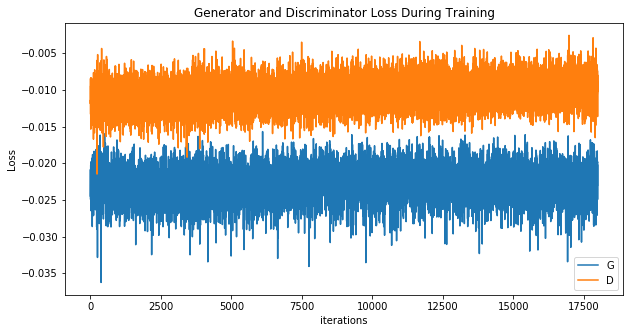

Iter-19000; D_loss: -0.00883130170404911; G_loss: -0.02510012872517109


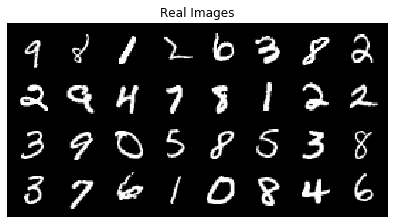

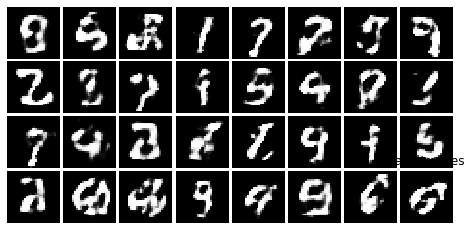

<Figure size 432x288 with 0 Axes>

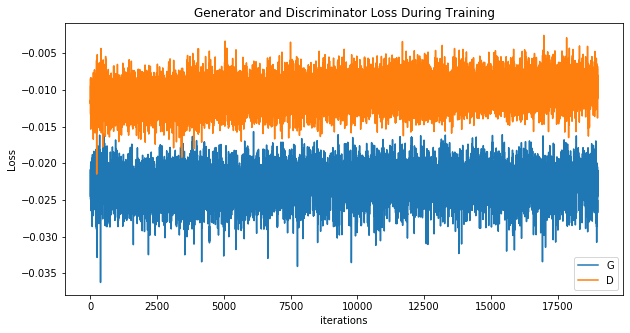

Iter-20000; D_loss: -0.007228981703519821; G_loss: -0.02119748294353485


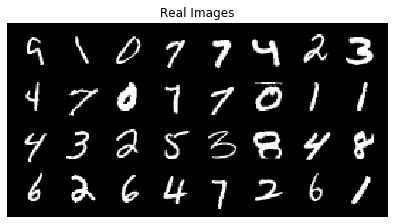

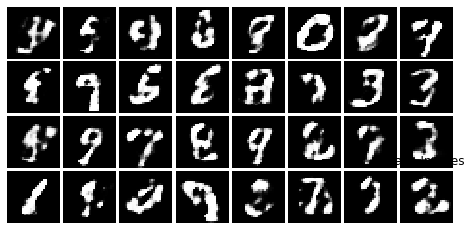

<Figure size 432x288 with 0 Axes>

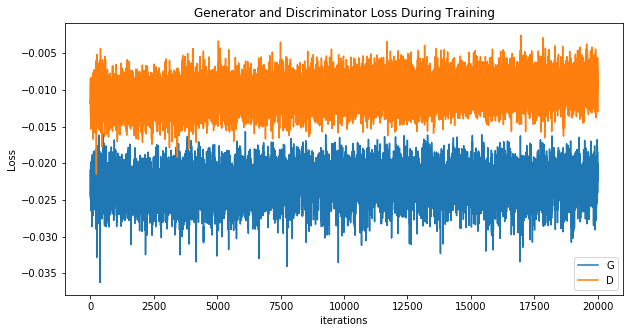

Iter-21000; D_loss: -0.009672317653894424; G_loss: -0.02513951063156128


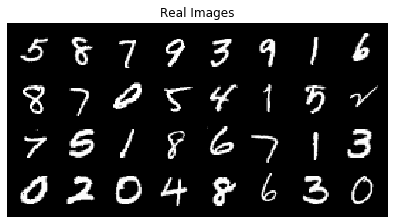

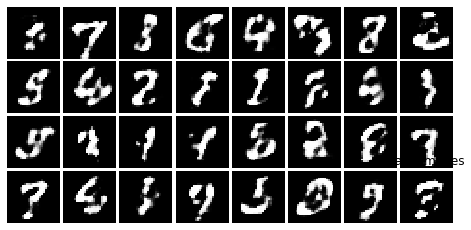

<Figure size 432x288 with 0 Axes>

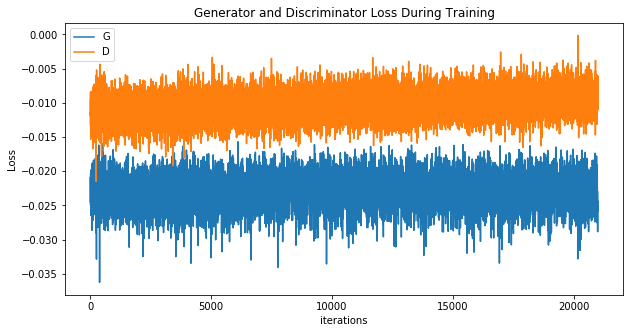

Iter-22000; D_loss: -0.00912395492196083; G_loss: -0.022361518815159798


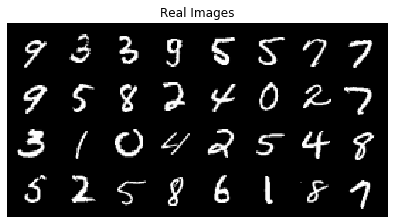

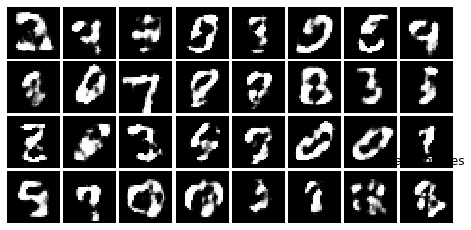

<Figure size 432x288 with 0 Axes>

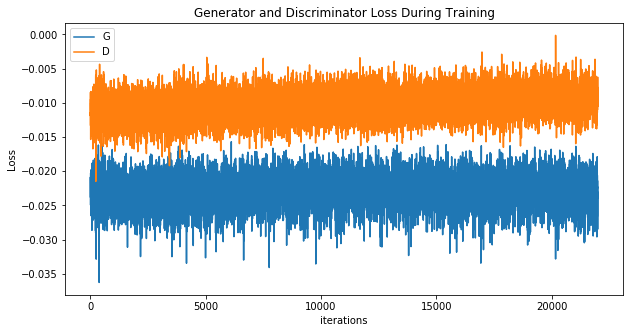

Iter-23000; D_loss: -0.009577415883541107; G_loss: -0.023948904126882553


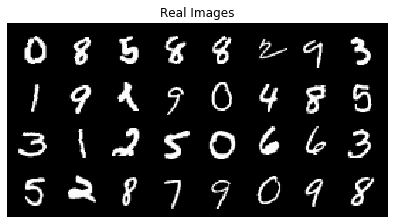

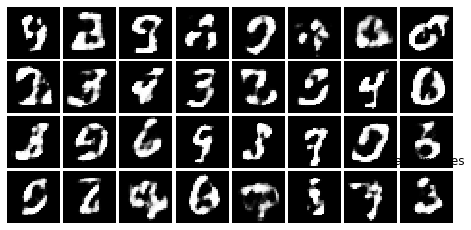

<Figure size 432x288 with 0 Axes>

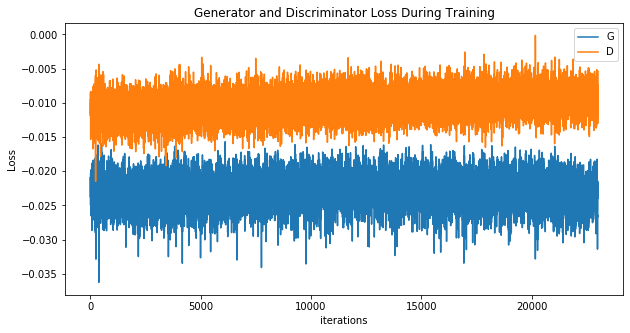

Iter-24000; D_loss: -0.008154915645718575; G_loss: -0.02553883194923401


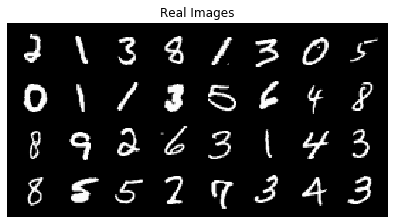

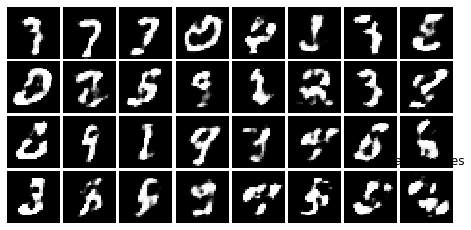

<Figure size 432x288 with 0 Axes>

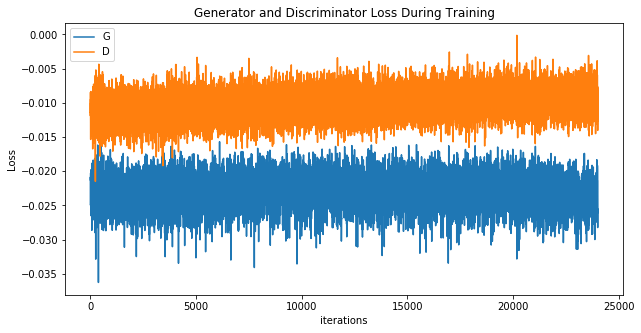

Iter-25000; D_loss: -0.010981380939483643; G_loss: -0.02262936346232891


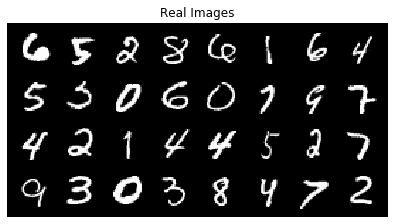

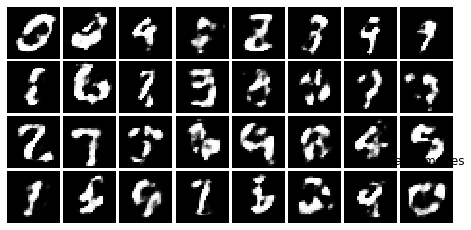

<Figure size 432x288 with 0 Axes>

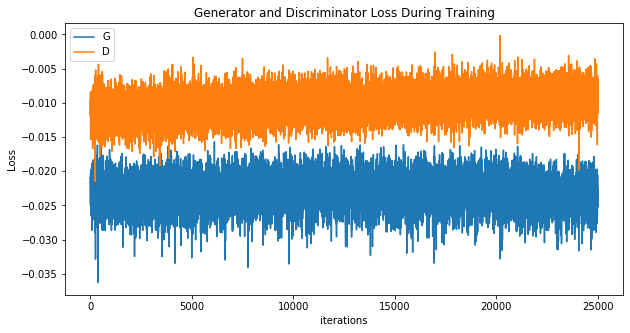

Iter-26000; D_loss: -0.00816282257437706; G_loss: -0.019667143002152443


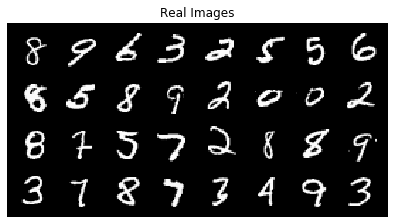

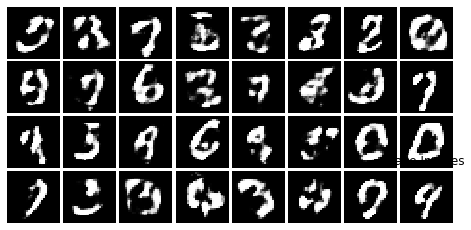

<Figure size 432x288 with 0 Axes>

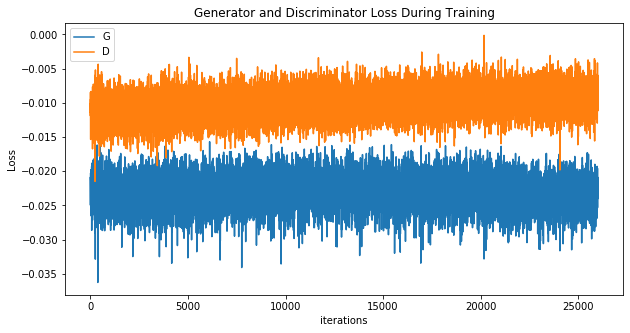

Iter-27000; D_loss: -0.007012823596596718; G_loss: -0.025542335584759712


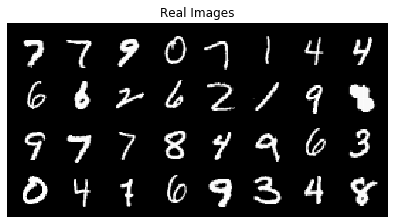

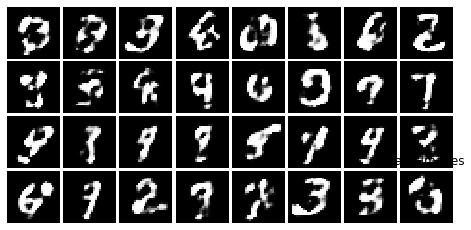

<Figure size 432x288 with 0 Axes>

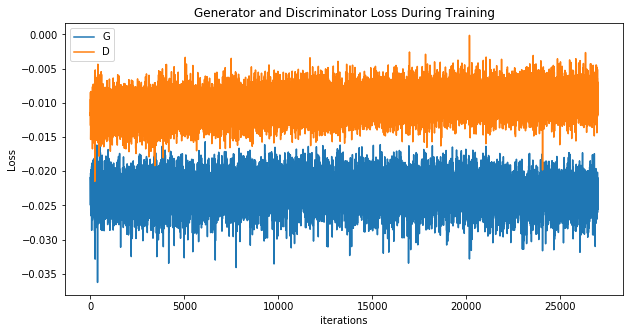

Iter-28000; D_loss: -0.00848769024014473; G_loss: -0.024142589420080185


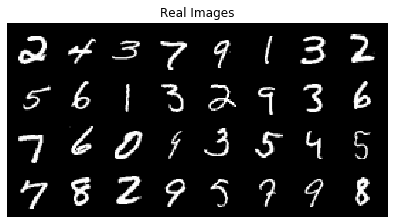

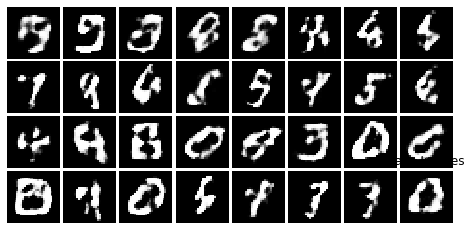

<Figure size 432x288 with 0 Axes>

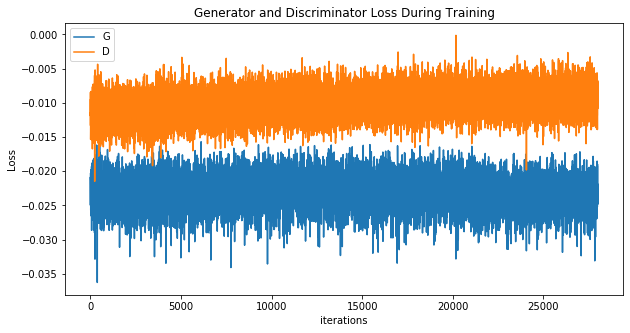

Iter-29000; D_loss: -0.010098706930875778; G_loss: -0.023173684254288673


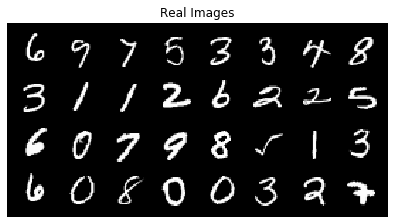

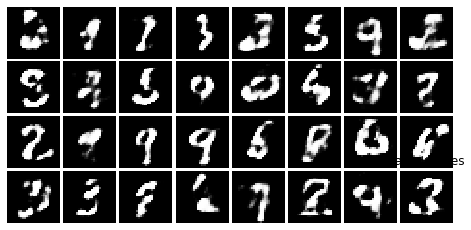

<Figure size 432x288 with 0 Axes>

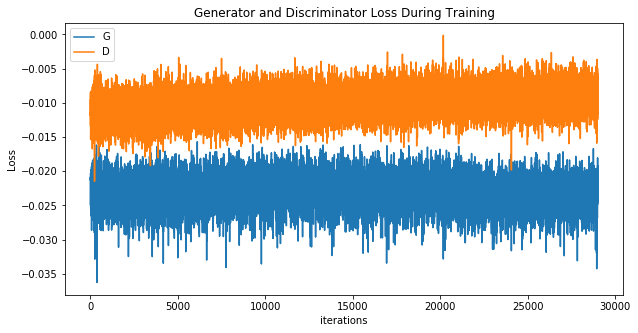

Iter-30000; D_loss: -0.009123977273702621; G_loss: -0.02229001186788082


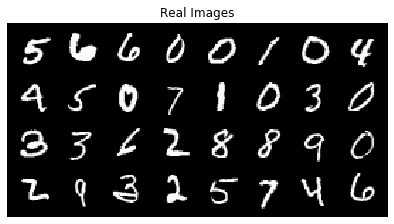

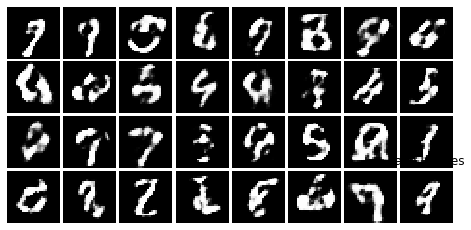

<Figure size 432x288 with 0 Axes>

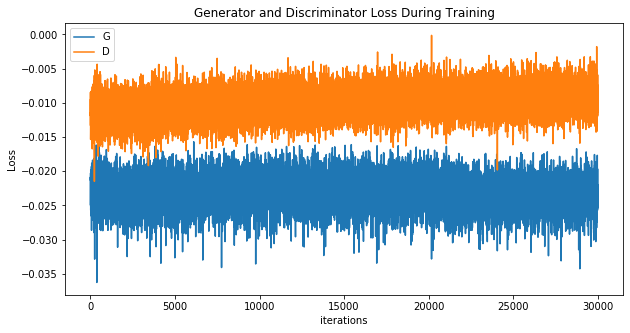

Iter-31000; D_loss: -0.009644361212849617; G_loss: -0.026909593492746353


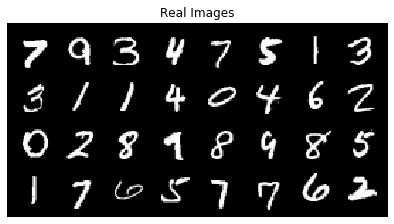

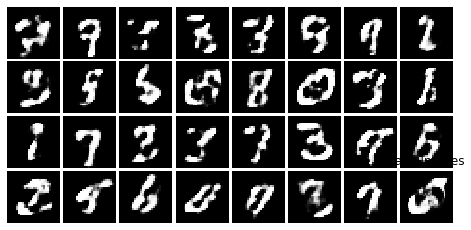

<Figure size 432x288 with 0 Axes>

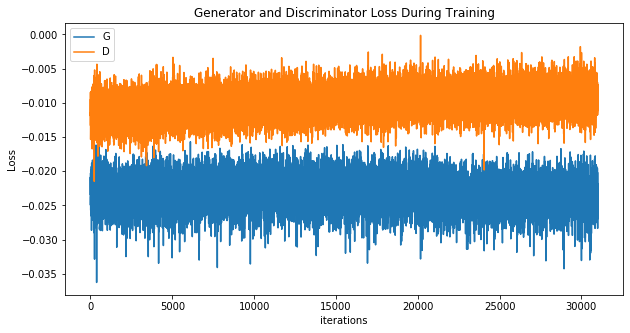

Iter-32000; D_loss: -0.008067157119512558; G_loss: -0.024227729067206383


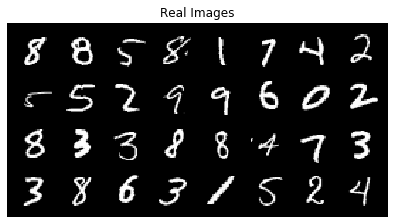

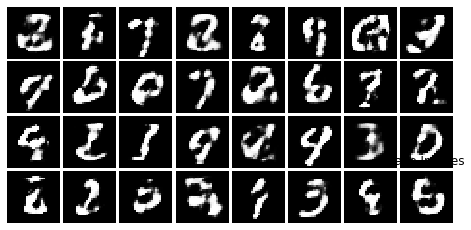

<Figure size 432x288 with 0 Axes>

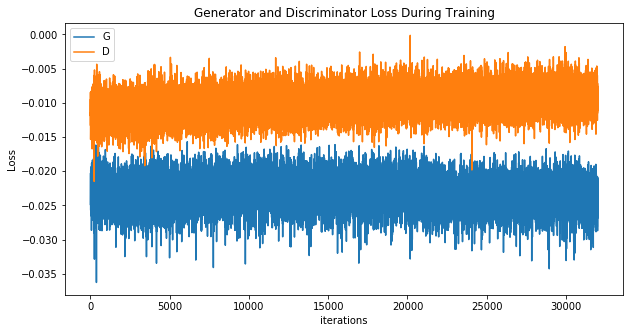

Iter-33000; D_loss: -0.009852947667241096; G_loss: -0.02246754802763462


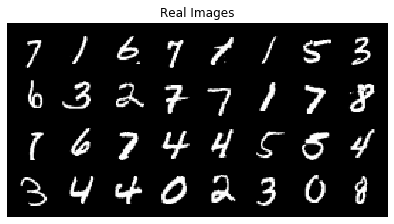

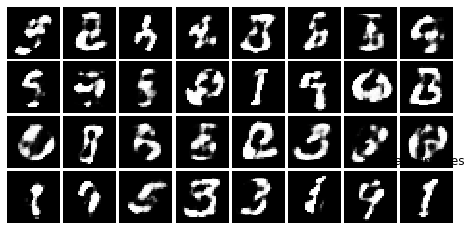

<Figure size 432x288 with 0 Axes>

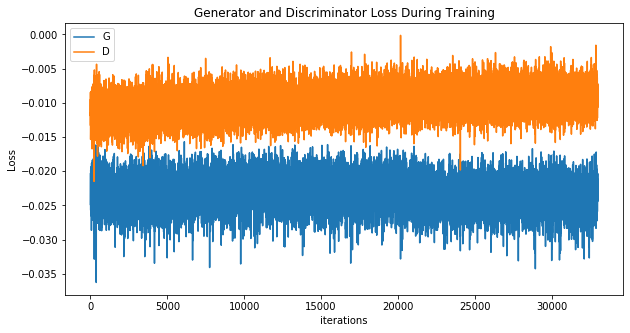

Iter-34000; D_loss: -0.011871760711073875; G_loss: -0.02107708342373371


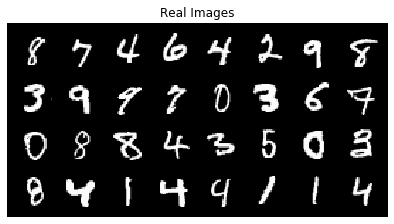

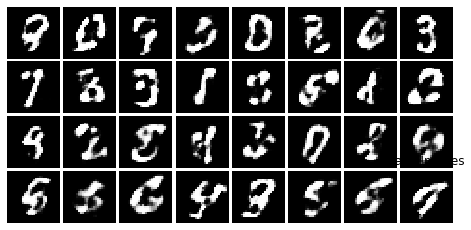

<Figure size 432x288 with 0 Axes>

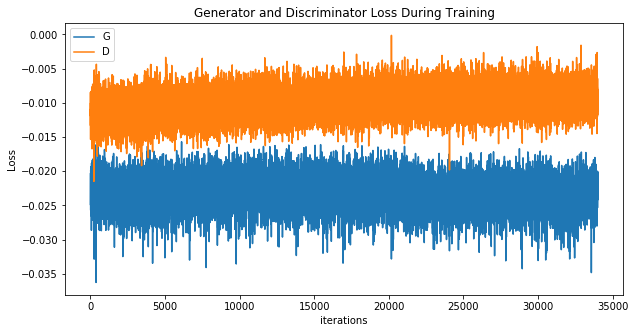

Iter-35000; D_loss: -0.005336981266736984; G_loss: -0.022744223475456238


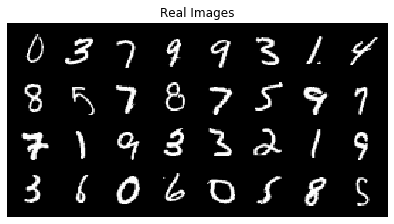

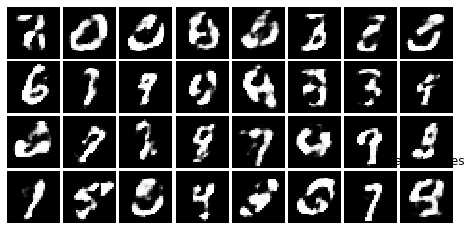

<Figure size 432x288 with 0 Axes>

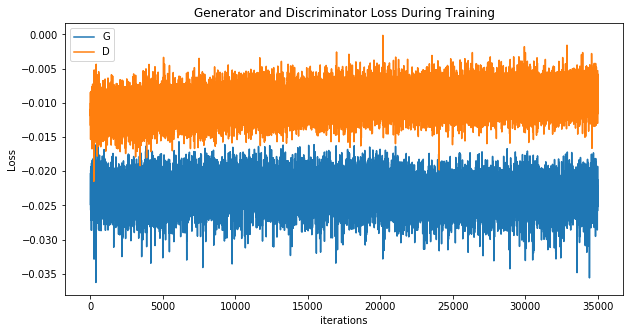

Iter-36000; D_loss: -0.009323092177510262; G_loss: -0.022251322865486145


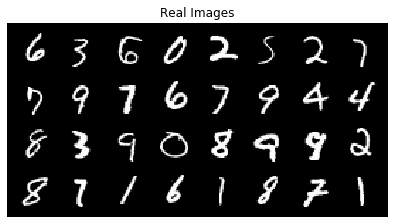

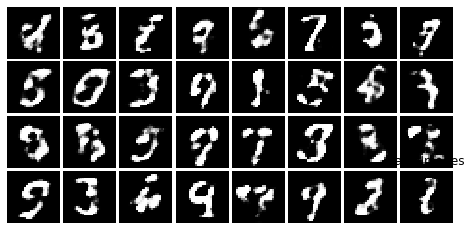

<Figure size 432x288 with 0 Axes>

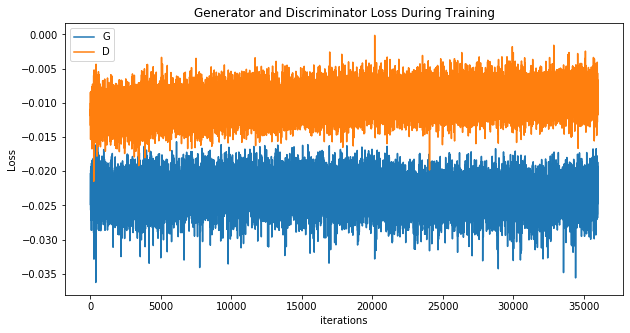

Iter-37000; D_loss: -0.010855330154299736; G_loss: -0.026875600218772888


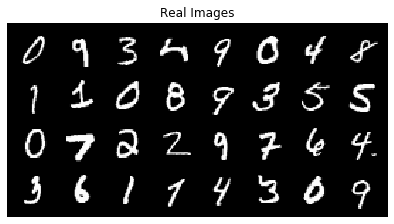

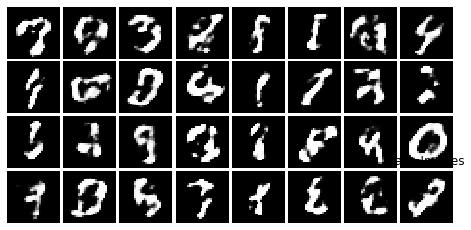

<Figure size 432x288 with 0 Axes>

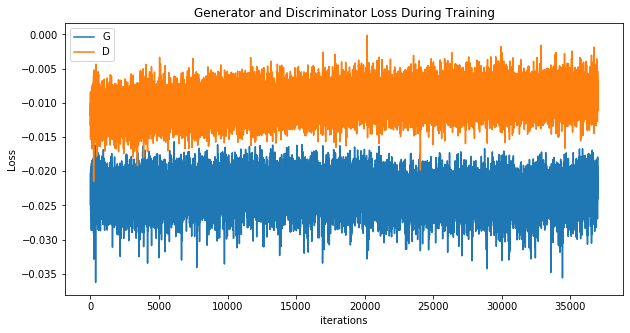

Iter-38000; D_loss: -0.008286099880933762; G_loss: -0.021383564919233322


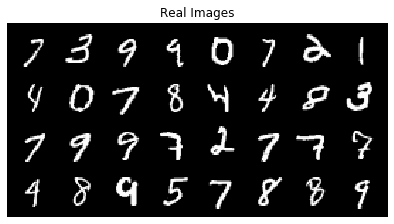

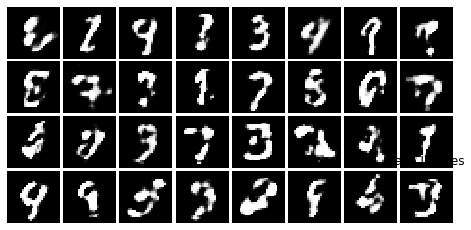

<Figure size 432x288 with 0 Axes>

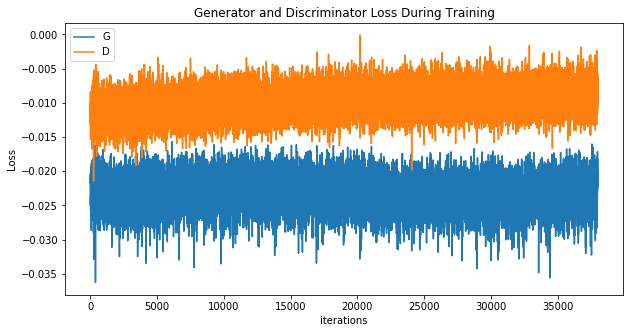

Iter-39000; D_loss: -0.009237587451934814; G_loss: -0.02704012766480446


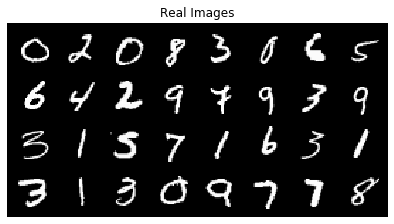

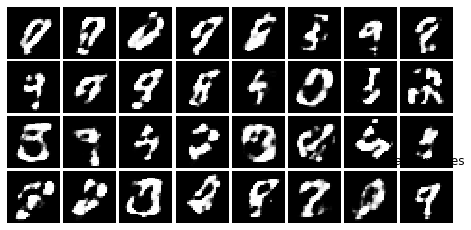

<Figure size 432x288 with 0 Axes>

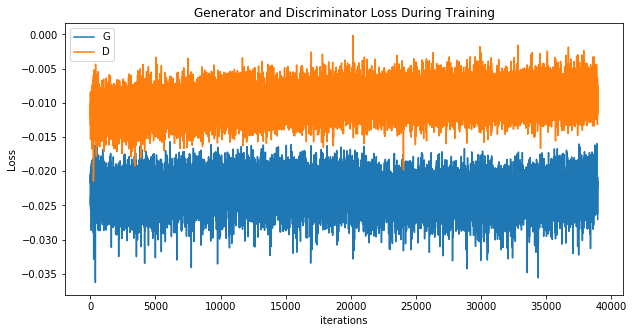

Iter-40000; D_loss: -0.009349623695015907; G_loss: -0.026382112875580788


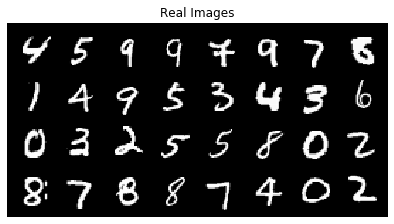

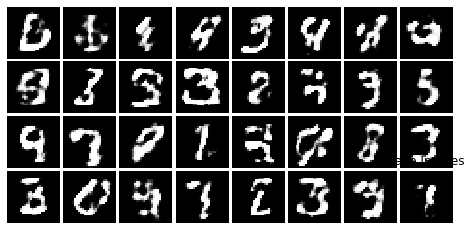

<Figure size 432x288 with 0 Axes>

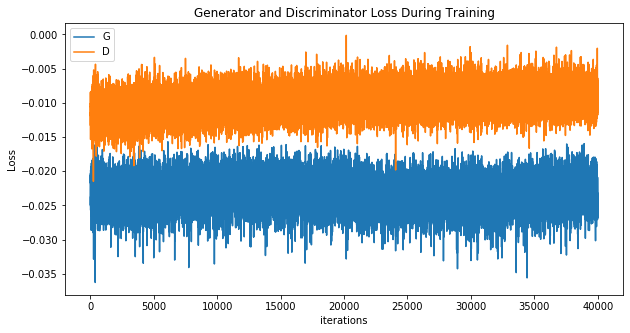

Iter-41000; D_loss: -0.004824060946702957; G_loss: -0.02343638427555561


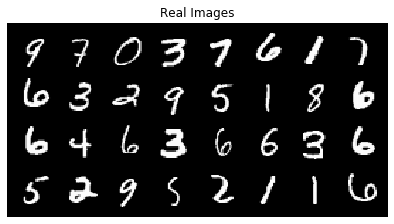

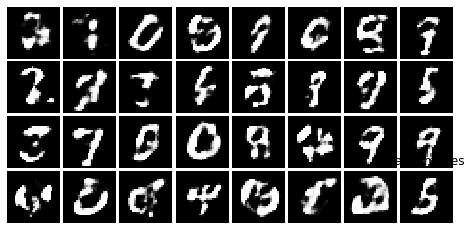

<Figure size 432x288 with 0 Axes>

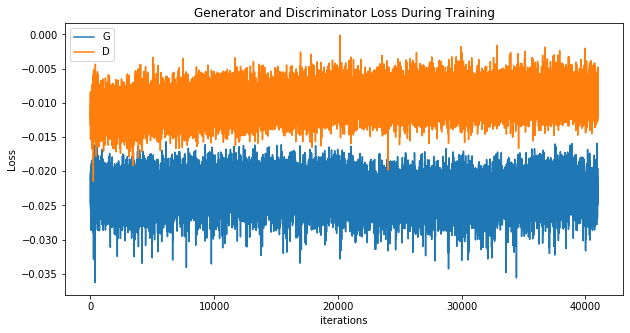

Iter-42000; D_loss: -0.007286448031663895; G_loss: -0.025451092049479485


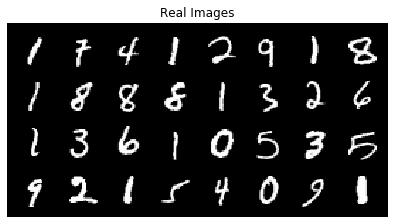

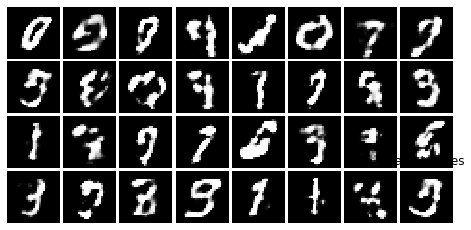

<Figure size 432x288 with 0 Axes>

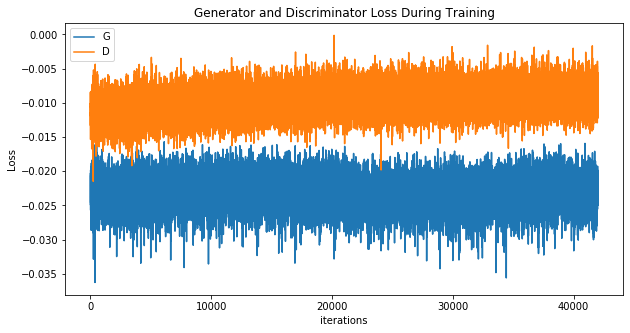

Iter-43000; D_loss: -0.009508078917860985; G_loss: -0.02359110116958618


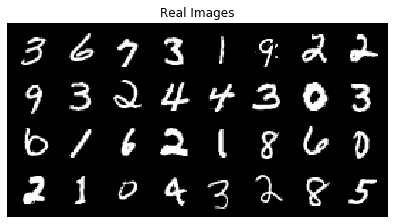

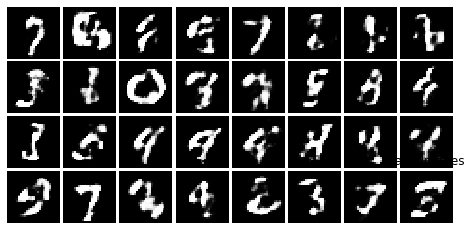

<Figure size 432x288 with 0 Axes>

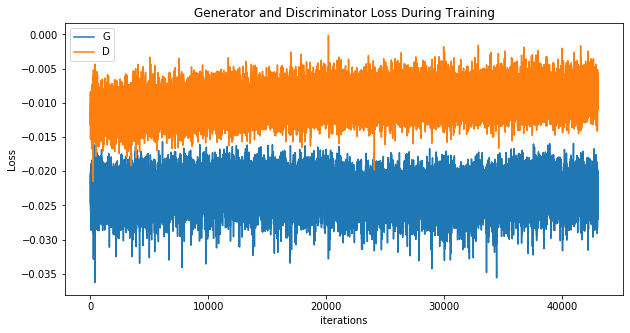

Iter-44000; D_loss: -0.007590431720018387; G_loss: -0.02233000658452511


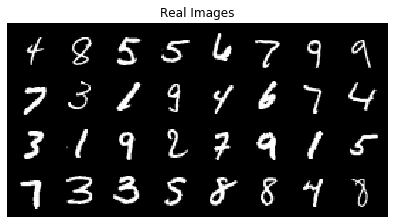

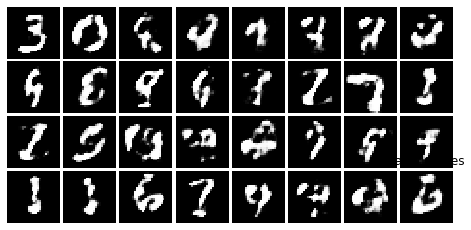

<Figure size 432x288 with 0 Axes>

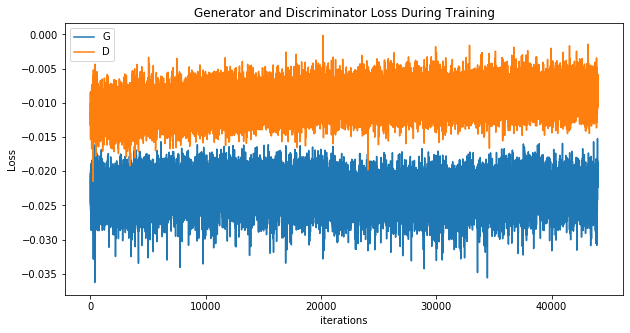

Iter-45000; D_loss: -0.008715266361832619; G_loss: -0.024798061698675156


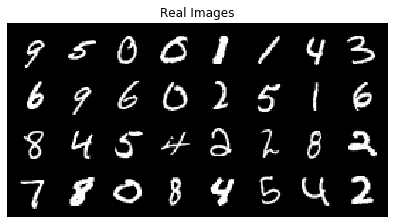

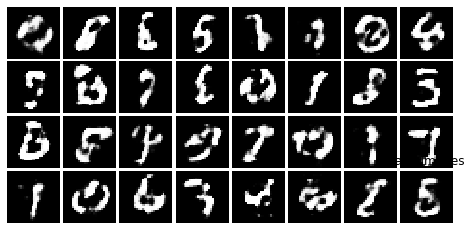

<Figure size 432x288 with 0 Axes>

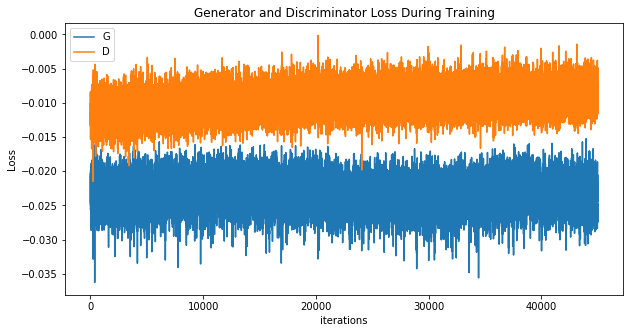

Iter-46000; D_loss: -0.006589800119400024; G_loss: -0.021936409175395966


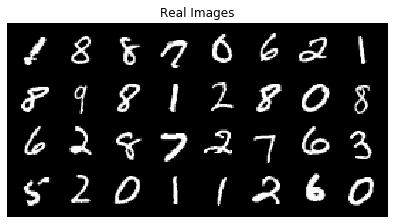

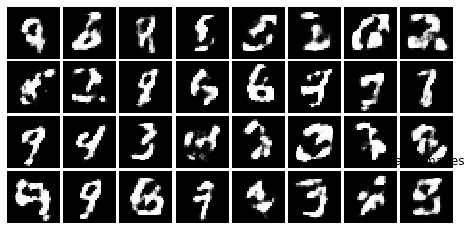

<Figure size 432x288 with 0 Axes>

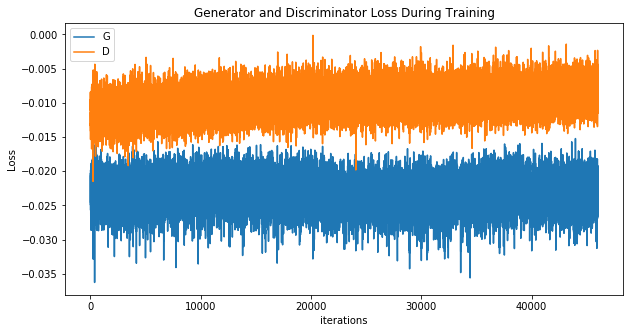

Iter-47000; D_loss: -0.007288288325071335; G_loss: -0.0220766793936491


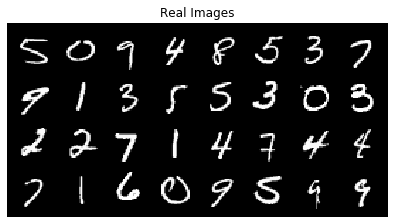

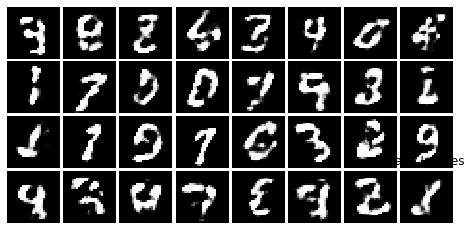

<Figure size 432x288 with 0 Axes>

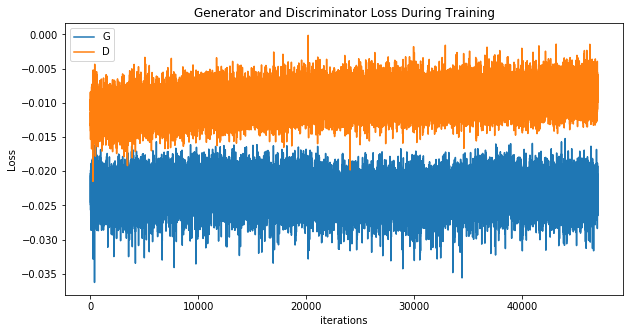

Iter-48000; D_loss: -0.0070351287722587585; G_loss: -0.022951539605855942


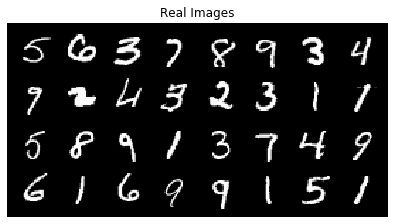

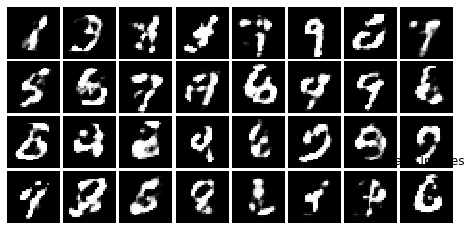

<Figure size 432x288 with 0 Axes>

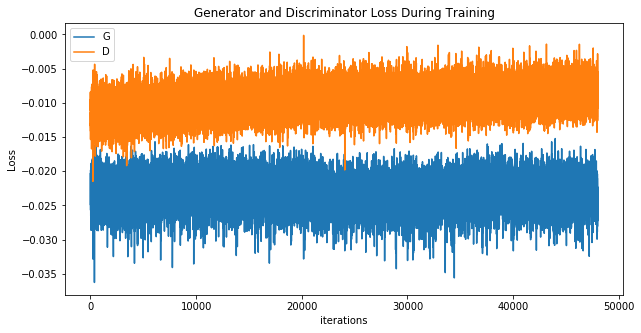

Iter-49000; D_loss: -0.0097112488001585; G_loss: -0.024535046890378


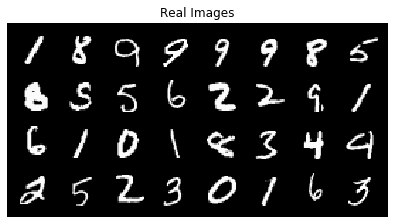

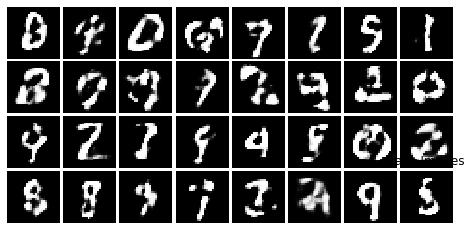

<Figure size 432x288 with 0 Axes>

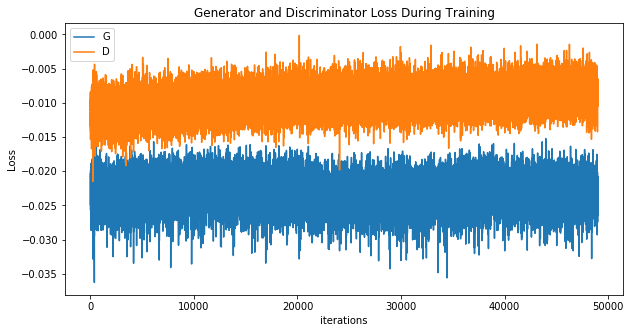

Iter-50000; D_loss: -0.008501086384057999; G_loss: -0.020431865006685257


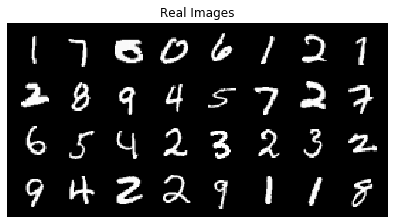

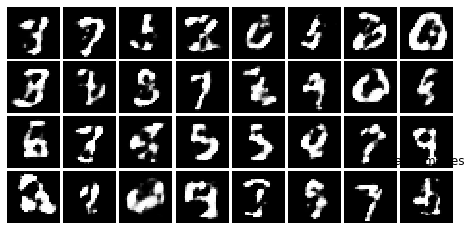

<Figure size 432x288 with 0 Axes>

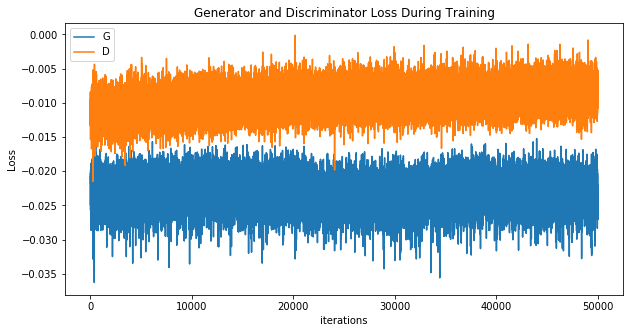

Iter-51000; D_loss: -0.00901707075536251; G_loss: -0.017973538488149643


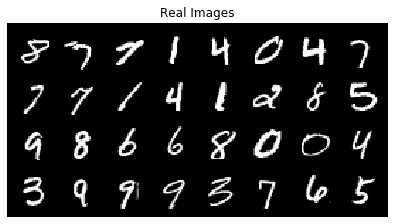

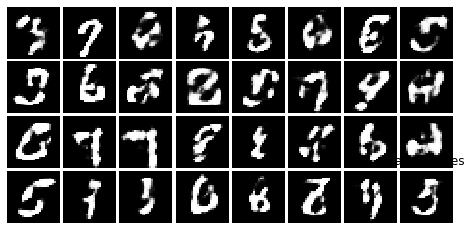

<Figure size 432x288 with 0 Axes>

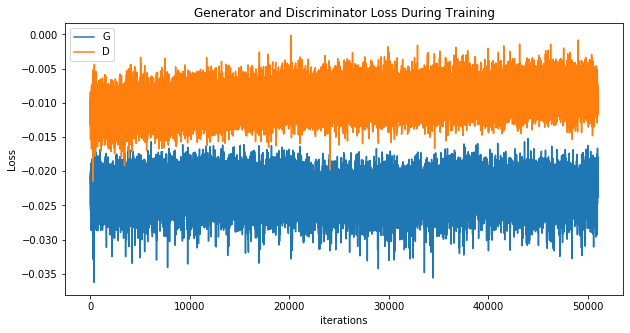

Iter-52000; D_loss: -0.007759923115372658; G_loss: -0.0225185826420784


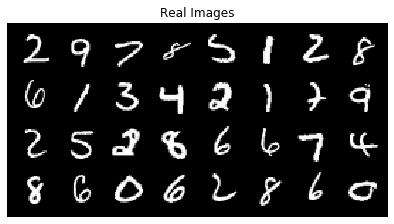

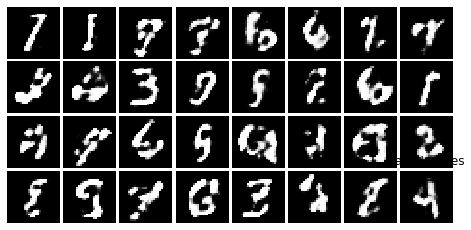

<Figure size 432x288 with 0 Axes>

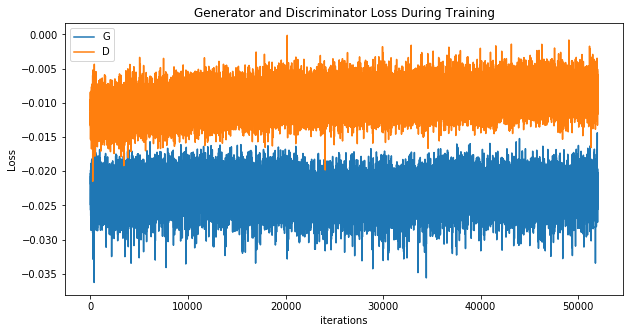

Iter-53000; D_loss: -0.007895924150943756; G_loss: -0.02244827151298523


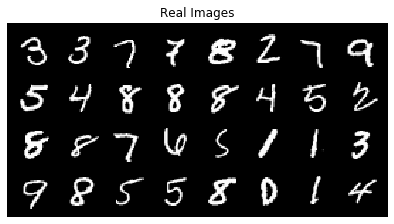

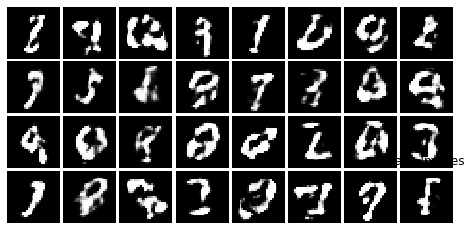

<Figure size 432x288 with 0 Axes>

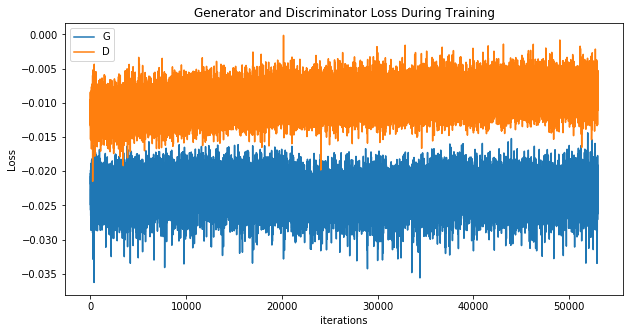

Iter-54000; D_loss: -0.005996890366077423; G_loss: -0.02320932224392891


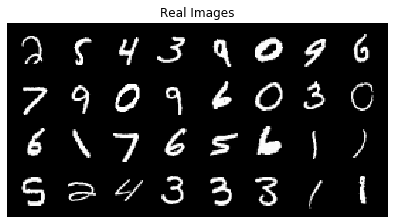

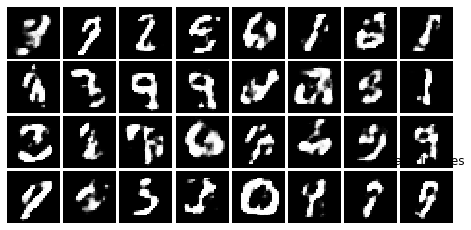

<Figure size 432x288 with 0 Axes>

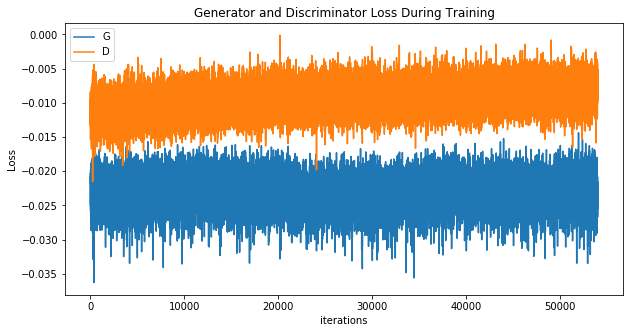

Iter-55000; D_loss: -0.012843664735555649; G_loss: -0.021955003961920738


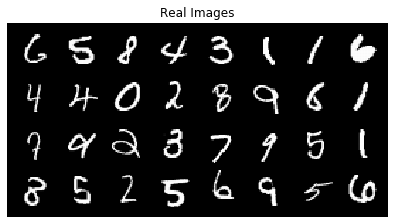

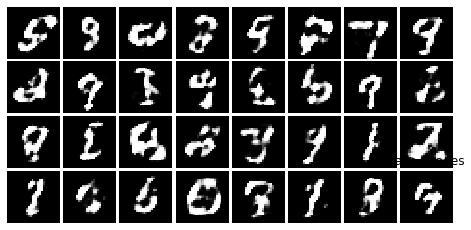

<Figure size 432x288 with 0 Axes>

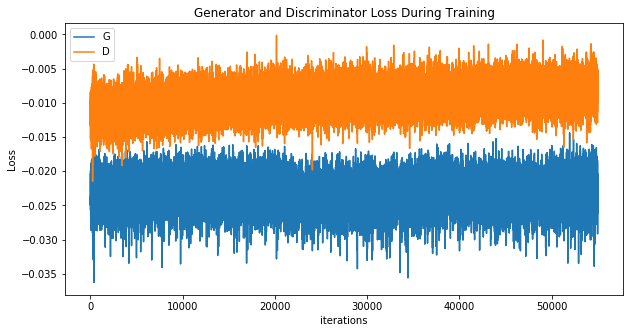

Iter-56000; D_loss: -0.010229663923382759; G_loss: -0.02287076599895954


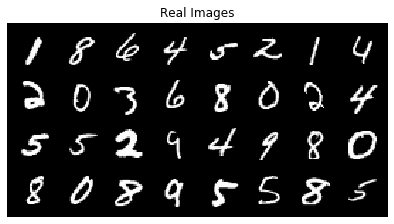

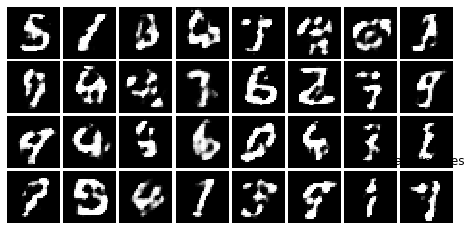

<Figure size 432x288 with 0 Axes>

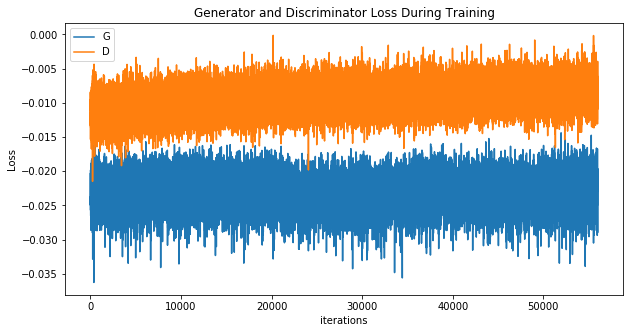

Iter-57000; D_loss: -0.004609201103448868; G_loss: -0.026685502380132675


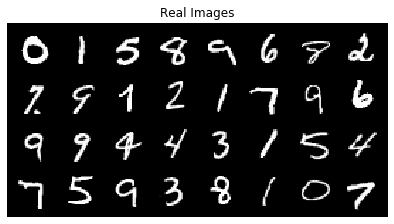

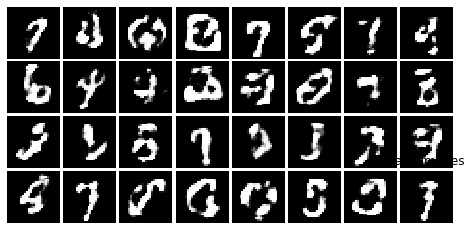

<Figure size 432x288 with 0 Axes>

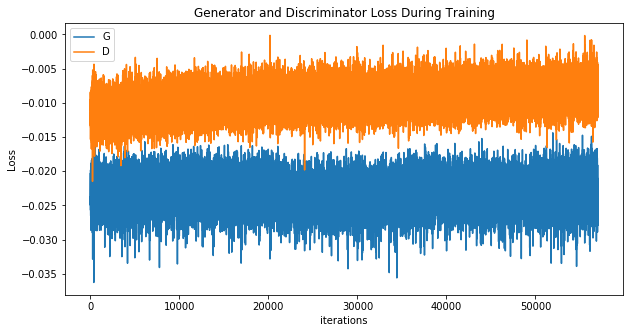

Iter-58000; D_loss: -0.009655902162194252; G_loss: -0.01753959245979786


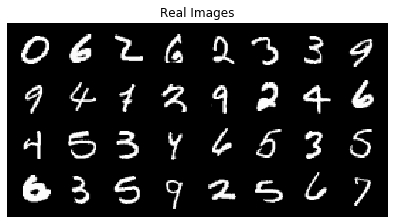

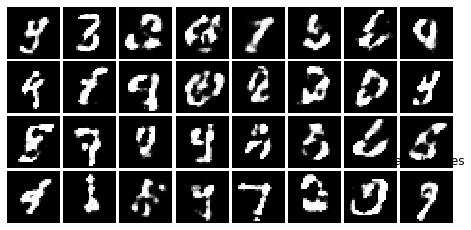

<Figure size 432x288 with 0 Axes>

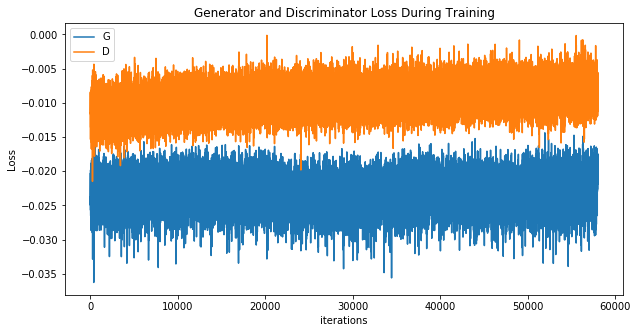

Iter-59000; D_loss: -0.007174273952841759; G_loss: -0.02429364249110222


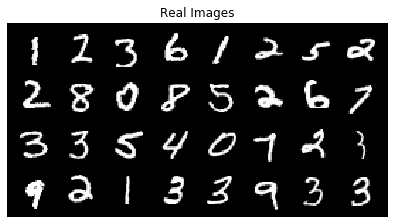

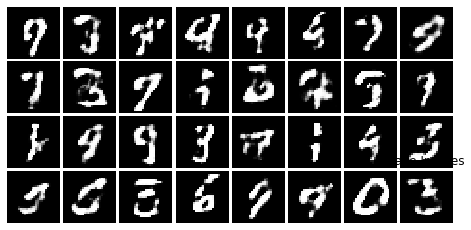

<Figure size 432x288 with 0 Axes>

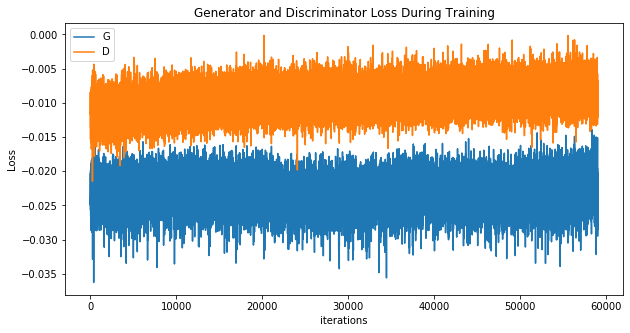

Iter-60000; D_loss: -0.005887318402528763; G_loss: -0.017131414264440536


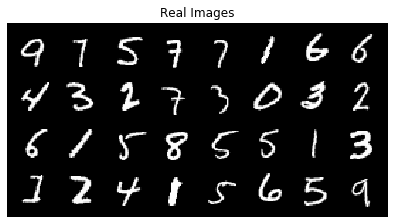

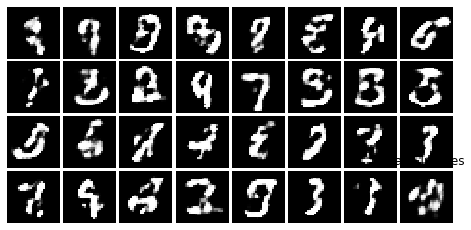

<Figure size 432x288 with 0 Axes>

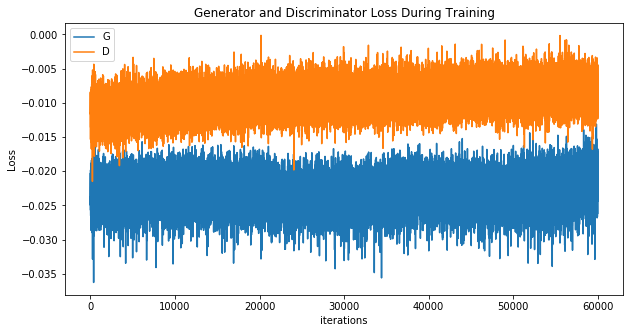

Iter-61000; D_loss: -0.007230993360280991; G_loss: -0.018908502534031868


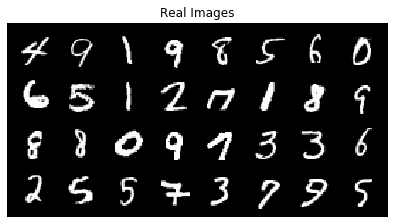

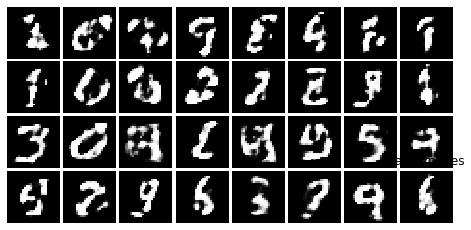

<Figure size 432x288 with 0 Axes>

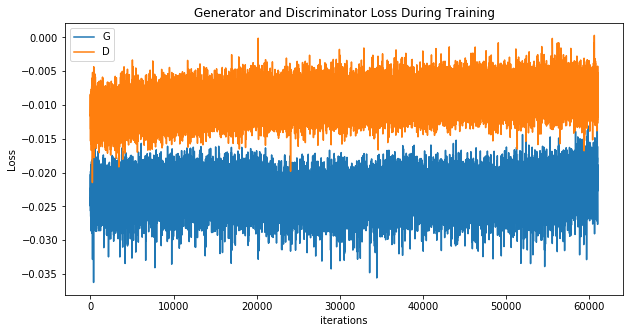

Iter-62000; D_loss: -0.006248196586966515; G_loss: -0.01721351407468319


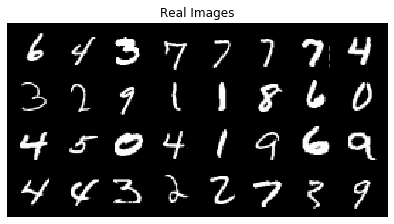

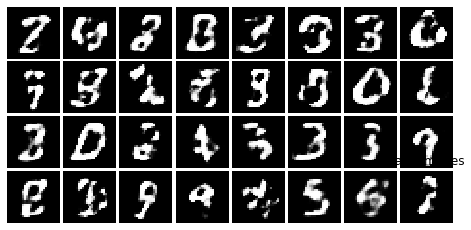

<Figure size 432x288 with 0 Axes>

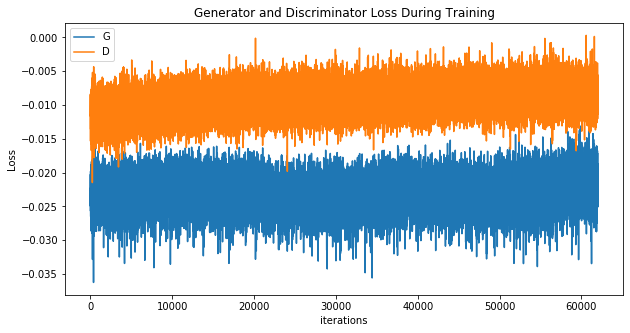

Iter-63000; D_loss: -0.00822848454117775; G_loss: -0.02423785999417305


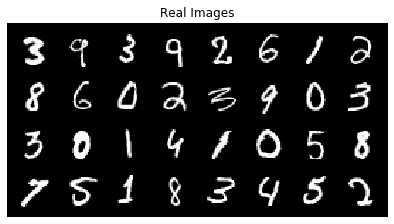

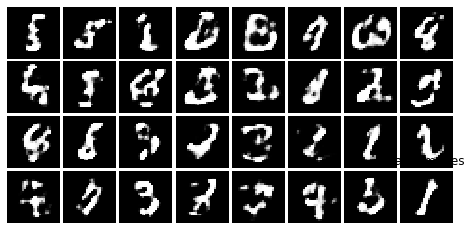

<Figure size 432x288 with 0 Axes>

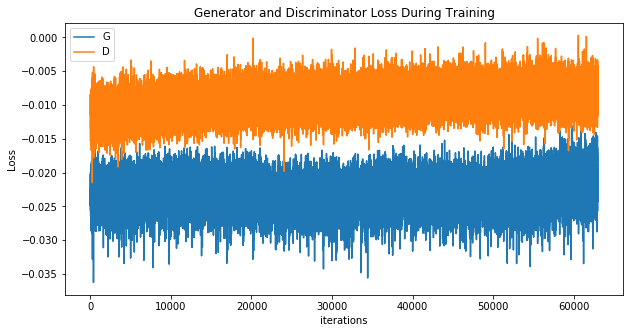

Iter-64000; D_loss: -0.008000651374459267; G_loss: -0.023107558488845825


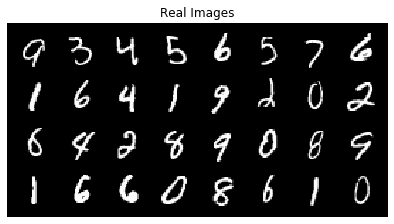

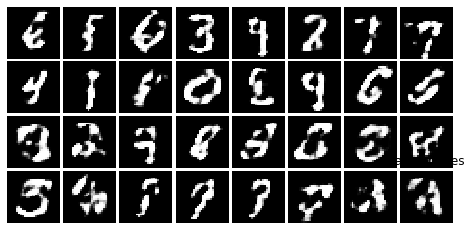

<Figure size 432x288 with 0 Axes>

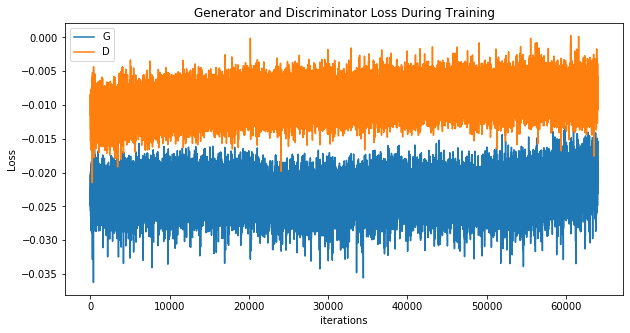

Iter-65000; D_loss: -0.008785543963313103; G_loss: -0.017485445365309715


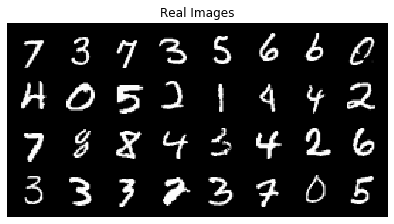

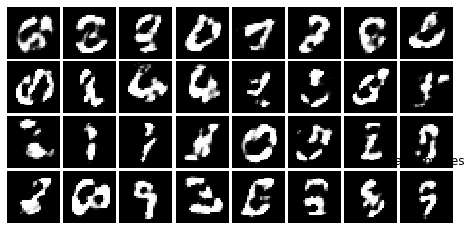

<Figure size 432x288 with 0 Axes>

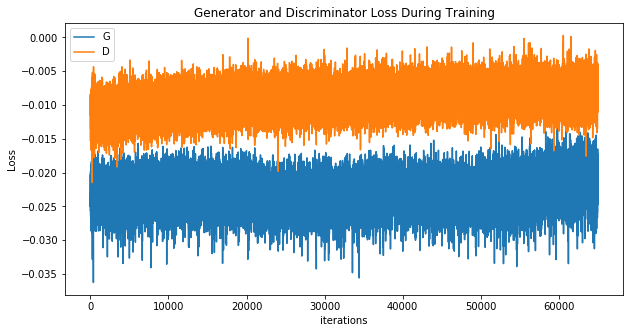

Iter-66000; D_loss: -0.0113290436565876; G_loss: -0.019084908068180084


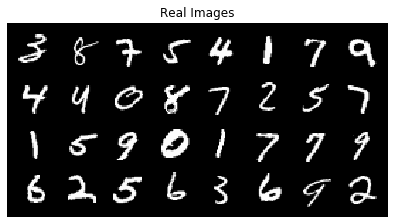

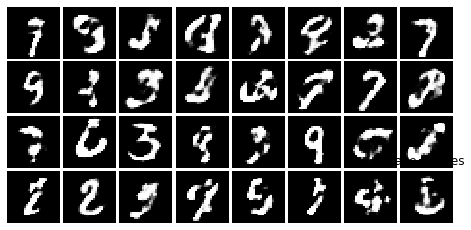

<Figure size 432x288 with 0 Axes>

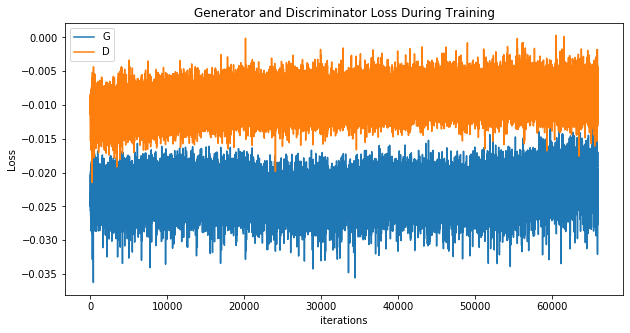

Iter-67000; D_loss: -0.010725220665335655; G_loss: -0.02133718691766262


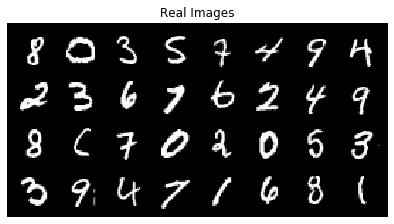

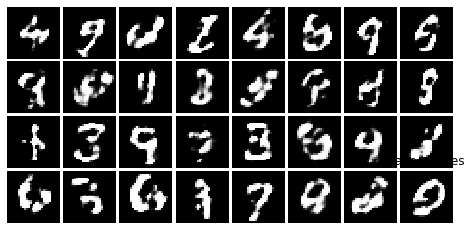

<Figure size 432x288 with 0 Axes>

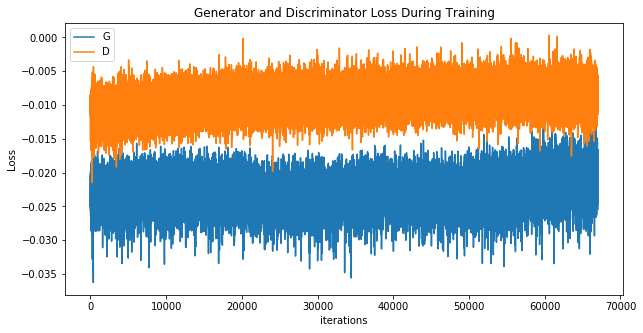

Iter-68000; D_loss: -0.010654374957084656; G_loss: -0.022068865597248077


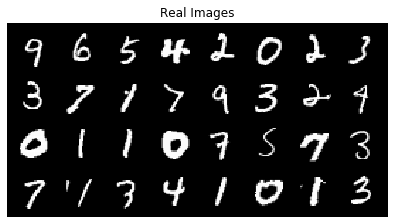

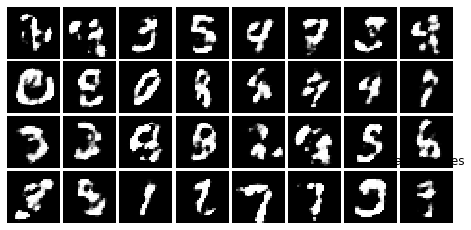

<Figure size 432x288 with 0 Axes>

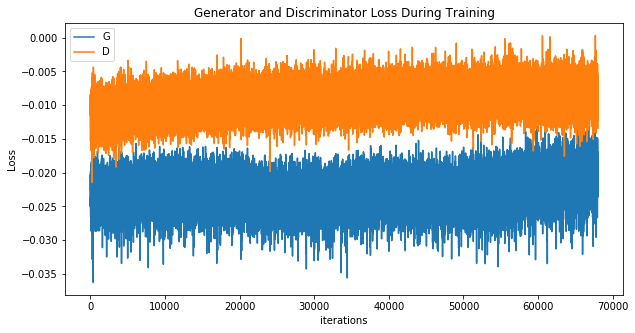

Iter-69000; D_loss: -0.00987459160387516; G_loss: -0.016710426658391953


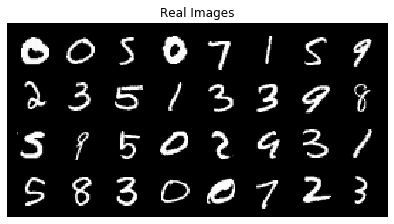

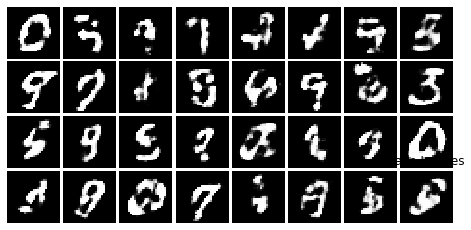

<Figure size 432x288 with 0 Axes>

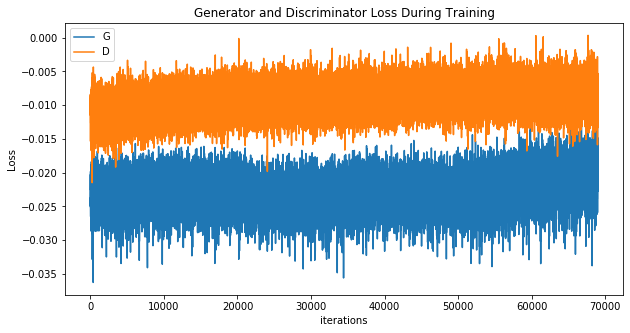

Iter-70000; D_loss: -0.003501029685139656; G_loss: -0.017457449808716774


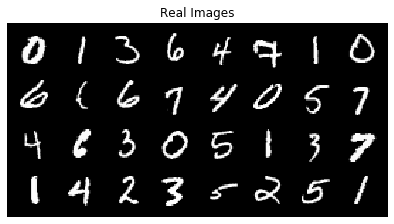

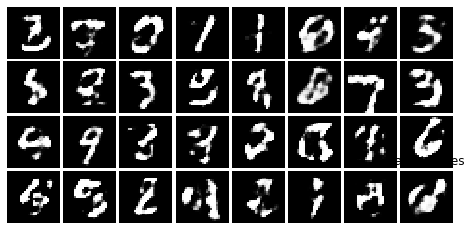

<Figure size 432x288 with 0 Axes>

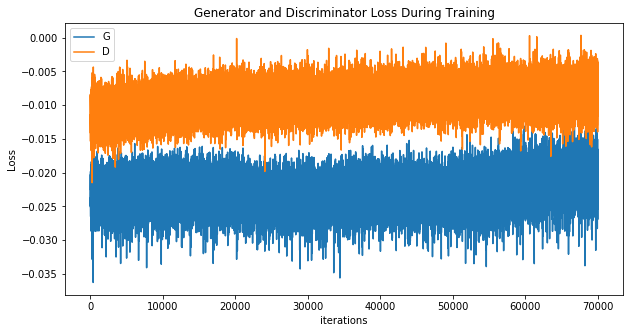

Iter-71000; D_loss: -0.008437536656856537; G_loss: -0.01904665119946003


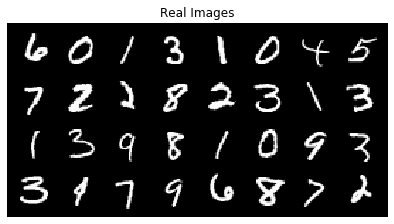

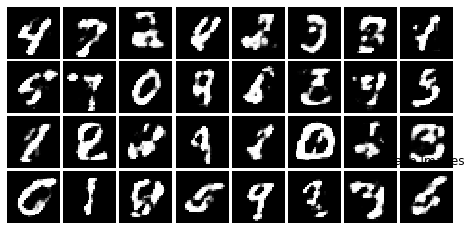

<Figure size 432x288 with 0 Axes>

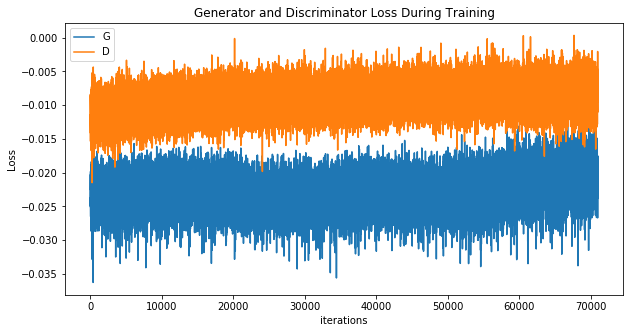

Iter-72000; D_loss: -0.0060213059186935425; G_loss: -0.01933911070227623


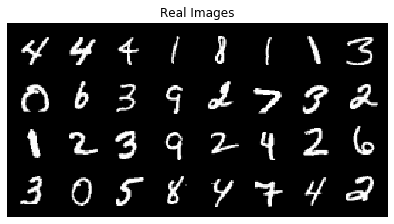

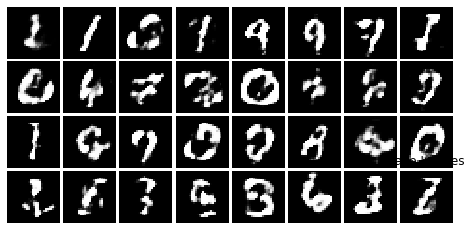

<Figure size 432x288 with 0 Axes>

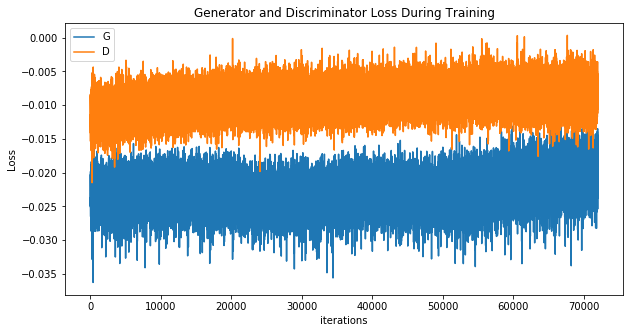

Iter-73000; D_loss: -0.00936204381287098; G_loss: -0.019452307373285294


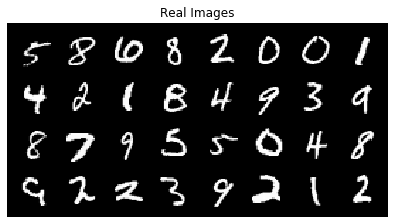

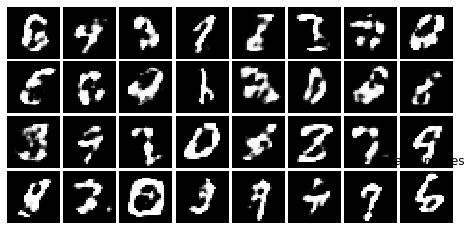

<Figure size 432x288 with 0 Axes>

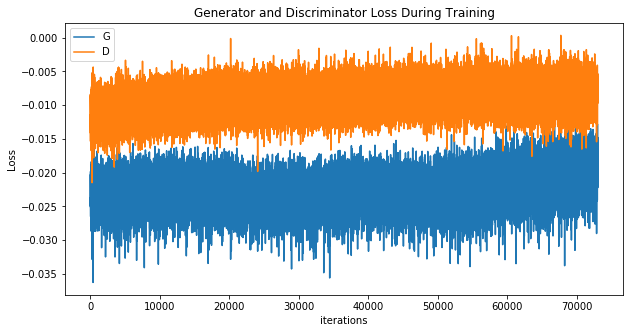

Iter-74000; D_loss: -0.006986901164054871; G_loss: -0.019323648884892464


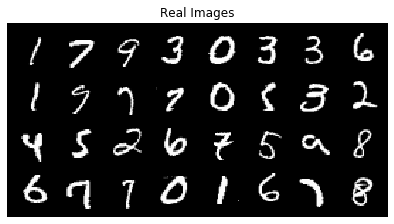

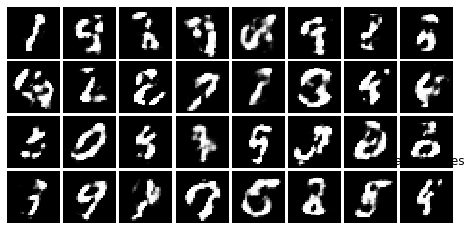

<Figure size 432x288 with 0 Axes>

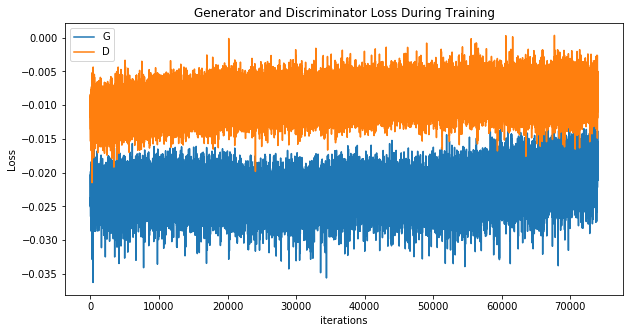

Iter-75000; D_loss: -0.007671250030398369; G_loss: -0.019781289622187614


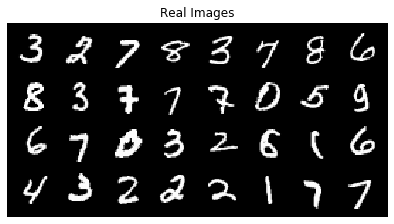

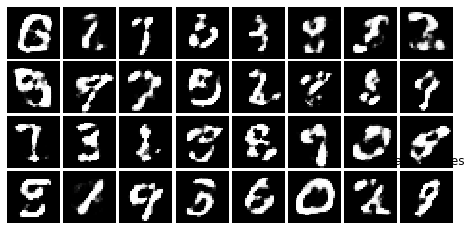

<Figure size 432x288 with 0 Axes>

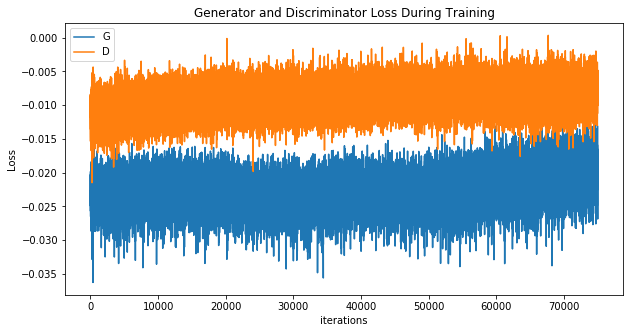

Iter-76000; D_loss: -0.01037469319999218; G_loss: -0.016575871035456657


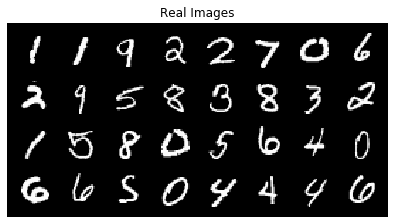

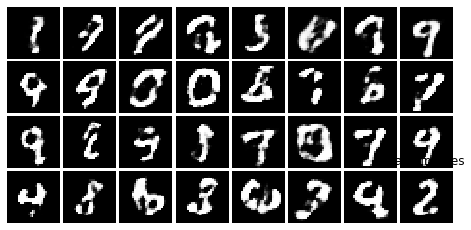

<Figure size 432x288 with 0 Axes>

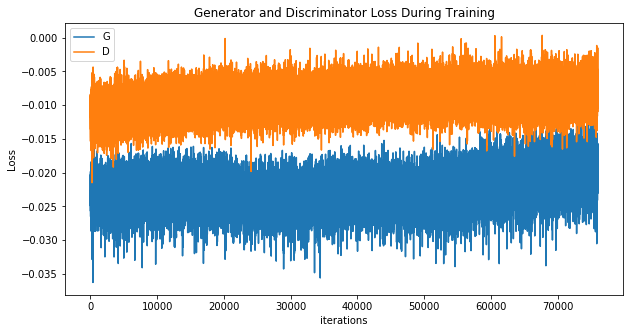

Iter-77000; D_loss: -0.00927528366446495; G_loss: -0.024259109050035477


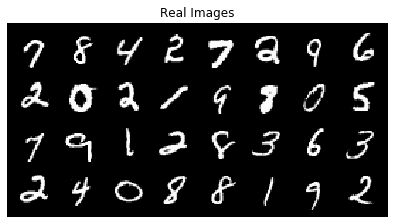

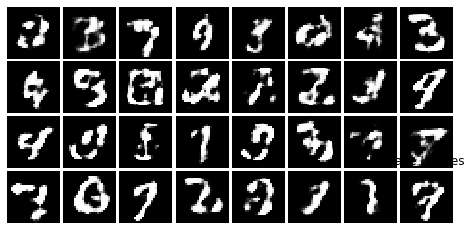

<Figure size 432x288 with 0 Axes>

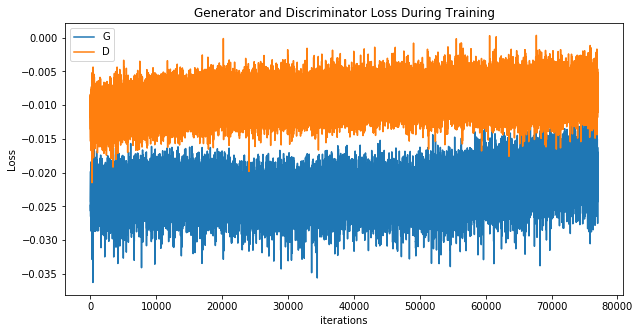

Iter-78000; D_loss: -0.011807985603809357; G_loss: -0.024924563243985176


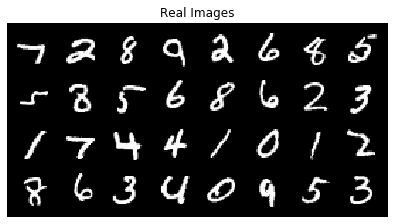

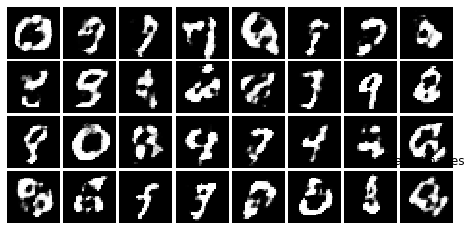

<Figure size 432x288 with 0 Axes>

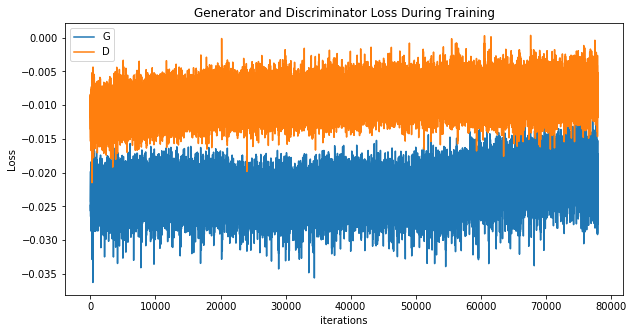

Iter-79000; D_loss: -0.009242337197065353; G_loss: -0.020744800567626953


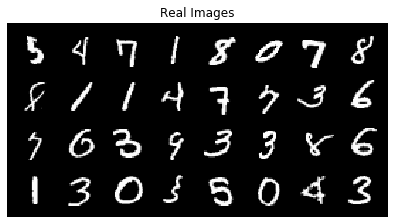

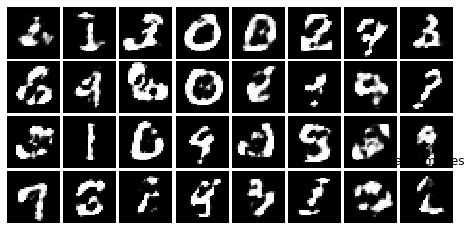

<Figure size 432x288 with 0 Axes>

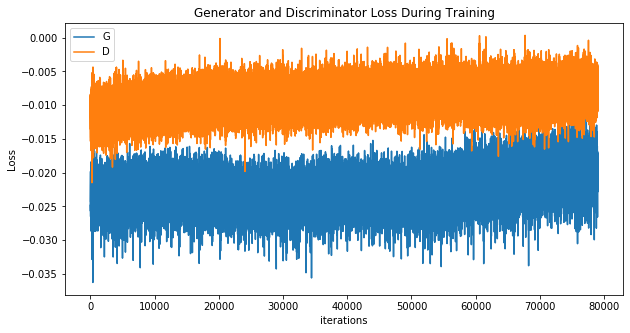

Iter-80000; D_loss: -0.008774545043706894; G_loss: -0.022954018786549568


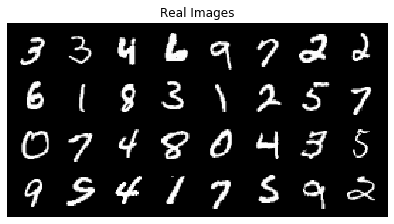

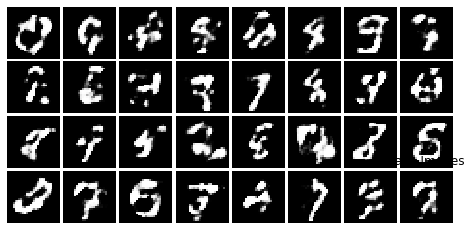

<Figure size 432x288 with 0 Axes>

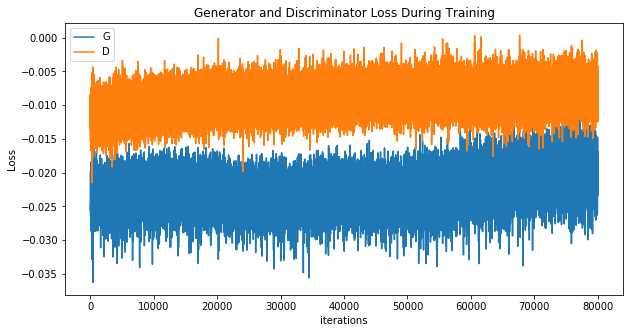

Iter-81000; D_loss: -0.009334756061434746; G_loss: -0.01772935874760151


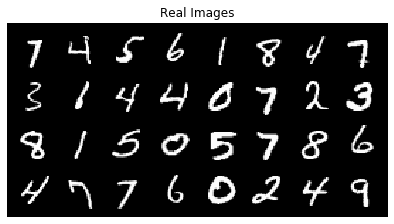

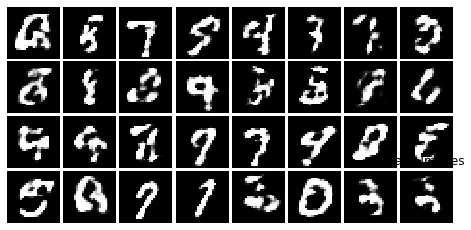

<Figure size 432x288 with 0 Axes>

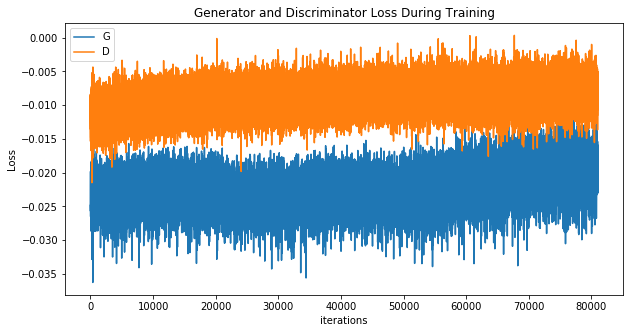

Iter-82000; D_loss: -0.007868152111768723; G_loss: -0.015077474527060986


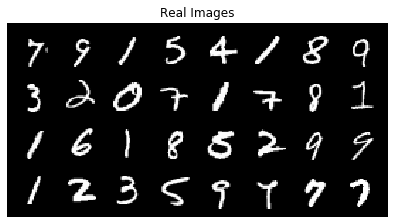

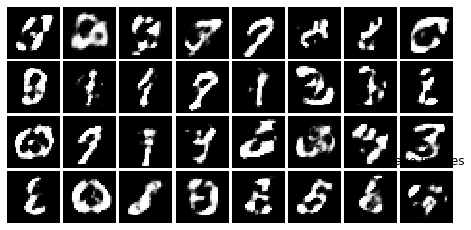

<Figure size 432x288 with 0 Axes>

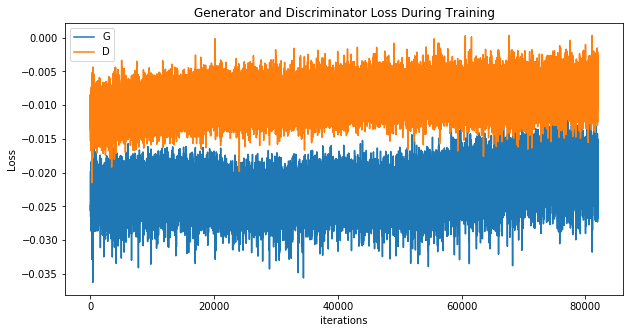

Iter-83000; D_loss: -0.009012816473841667; G_loss: -0.01784529723227024


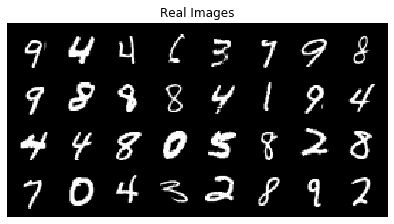

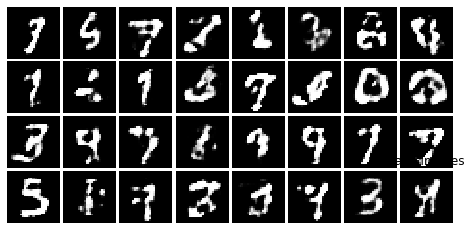

<Figure size 432x288 with 0 Axes>

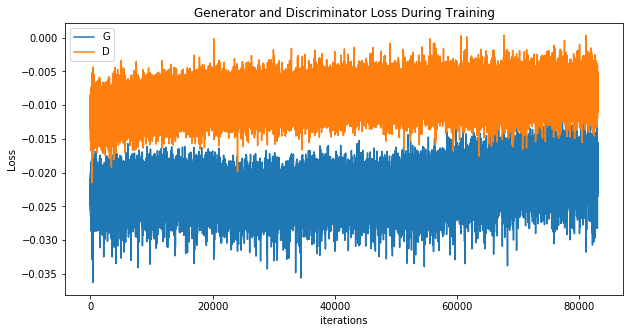

Iter-84000; D_loss: -0.008797554299235344; G_loss: -0.018416877835989


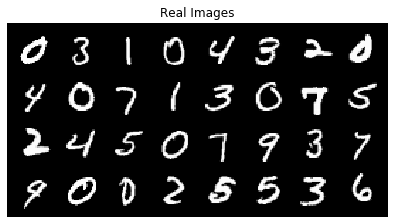

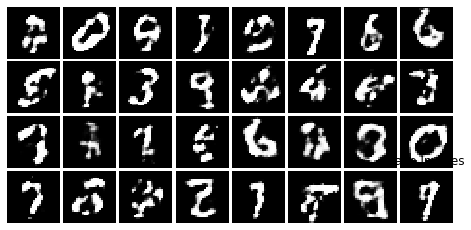

<Figure size 432x288 with 0 Axes>

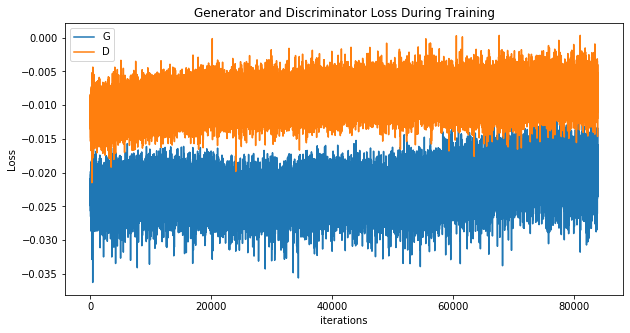

Iter-85000; D_loss: -0.009612563997507095; G_loss: -0.022508002817630768


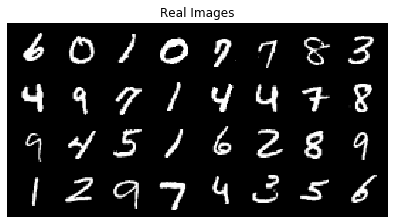

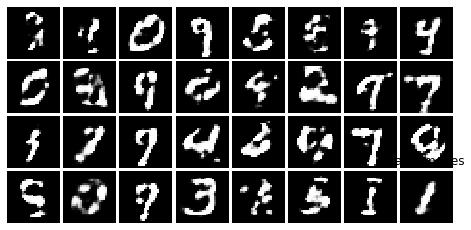

<Figure size 432x288 with 0 Axes>

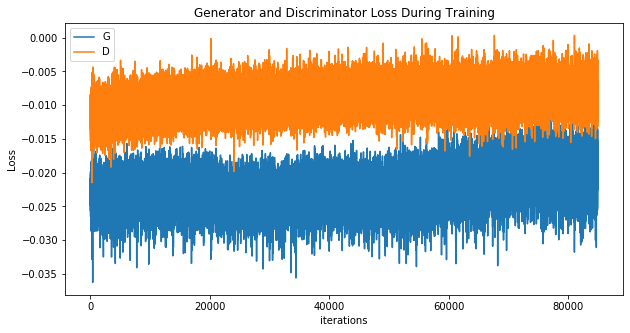

Iter-86000; D_loss: -0.0062019601464271545; G_loss: -0.018947094678878784


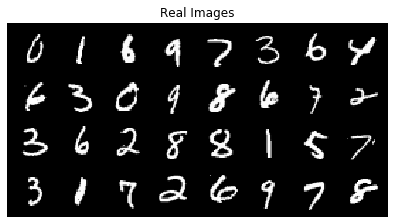

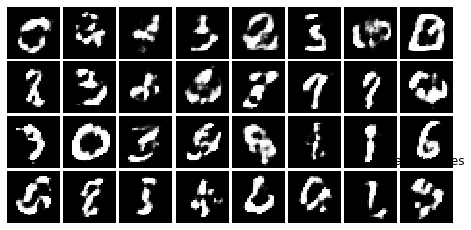

<Figure size 432x288 with 0 Axes>

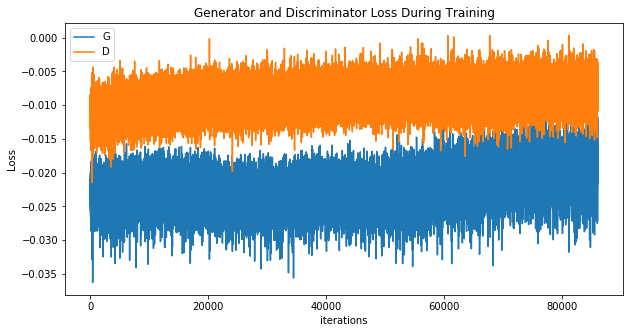

Iter-87000; D_loss: -0.009326107800006866; G_loss: -0.01905694790184498


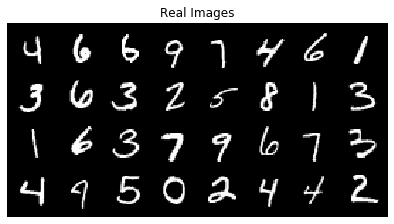

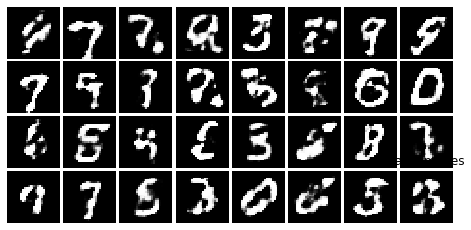

<Figure size 432x288 with 0 Axes>

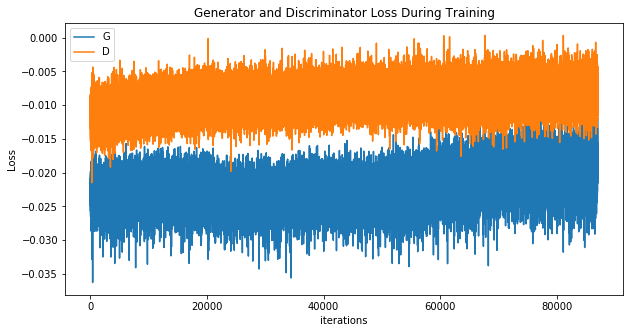

Iter-88000; D_loss: -0.007241407409310341; G_loss: -0.01918177679181099


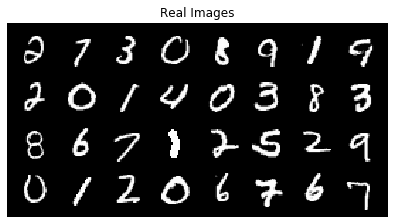

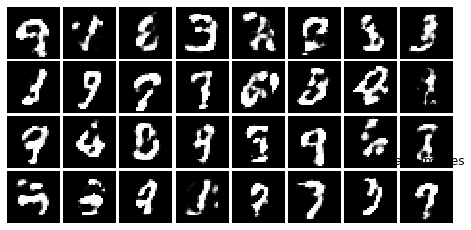

<Figure size 432x288 with 0 Axes>

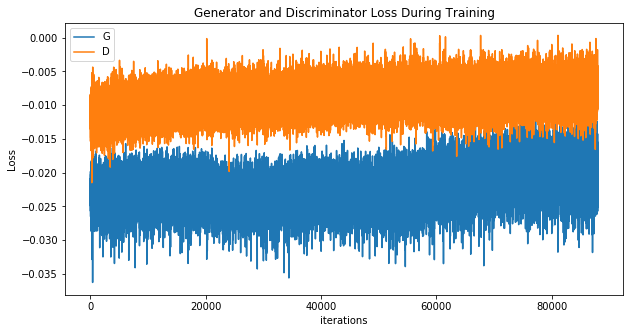

Iter-89000; D_loss: -0.010541737079620361; G_loss: -0.023235442116856575


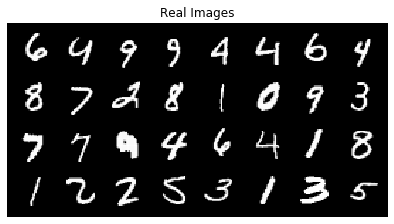

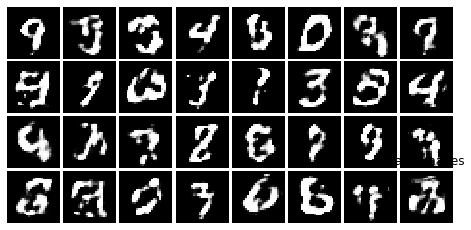

<Figure size 432x288 with 0 Axes>

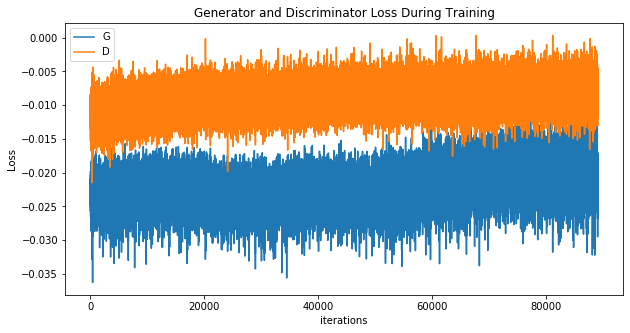

Iter-90000; D_loss: -0.004193754866719246; G_loss: -0.019239570945501328


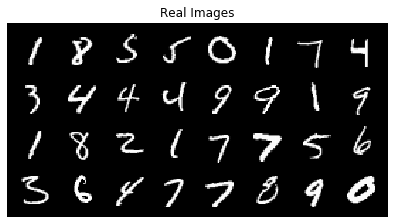

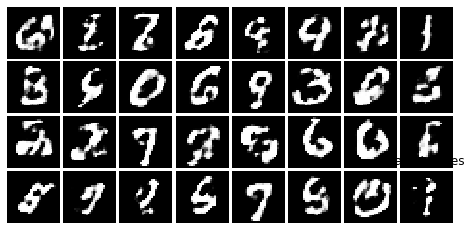

<Figure size 432x288 with 0 Axes>

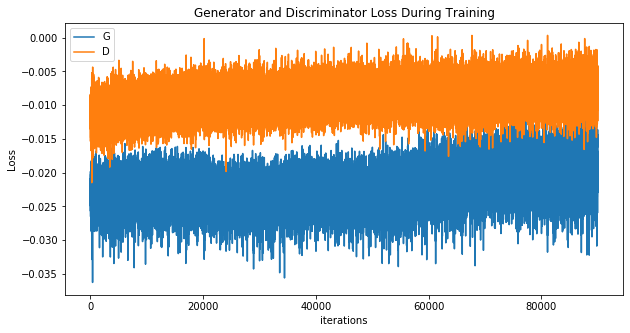

Iter-91000; D_loss: -0.009463474154472351; G_loss: -0.019811224192380905


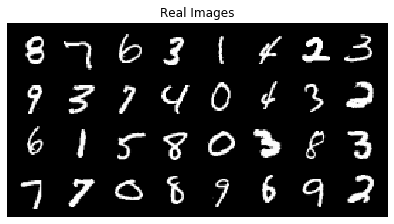

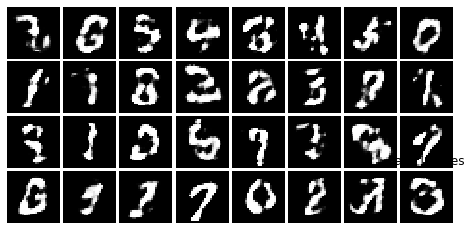

<Figure size 432x288 with 0 Axes>

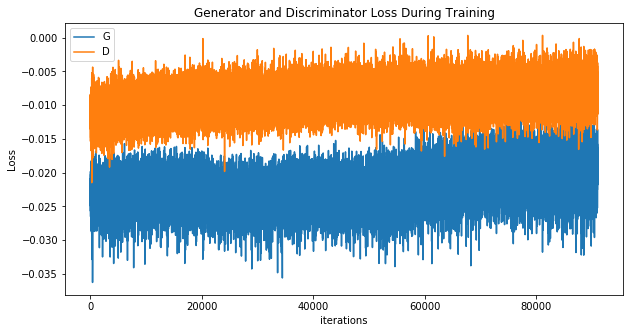

Iter-92000; D_loss: -0.009050969034433365; G_loss: -0.02009117603302002


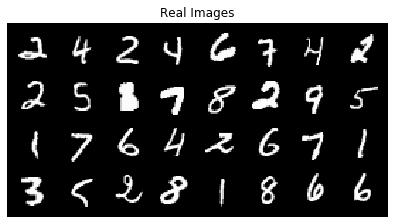

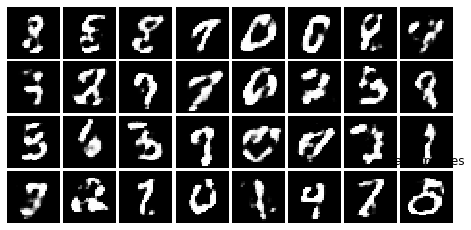

<Figure size 432x288 with 0 Axes>

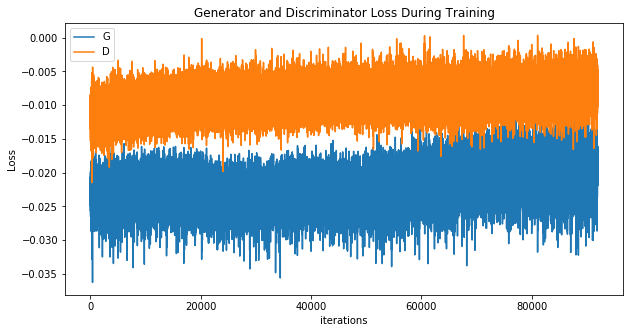

Iter-93000; D_loss: -0.006139406934380531; G_loss: -0.019766254350543022


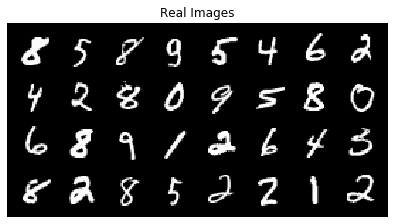

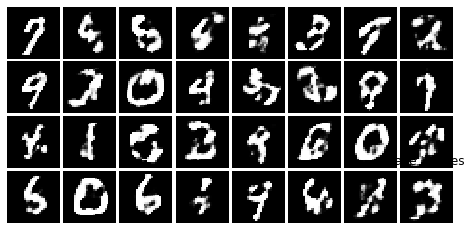

<Figure size 432x288 with 0 Axes>

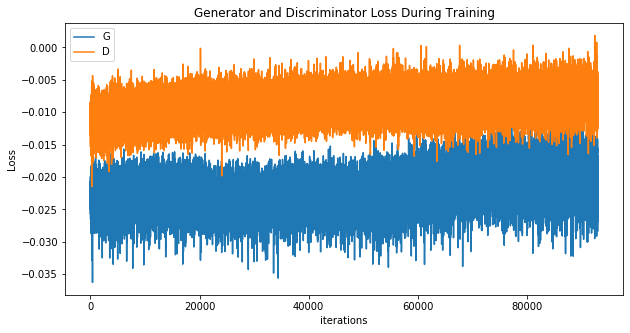

Iter-94000; D_loss: -0.00944397784769535; G_loss: -0.020424773916602135


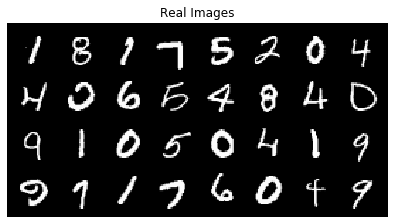

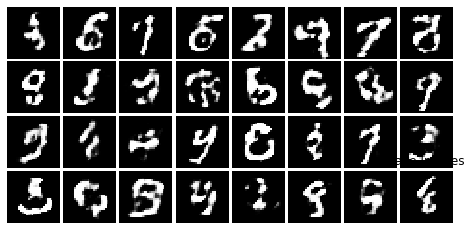

<Figure size 432x288 with 0 Axes>

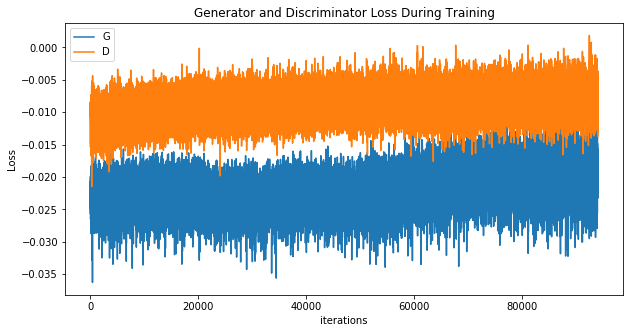

Iter-95000; D_loss: -0.007343322038650513; G_loss: -0.015642991289496422


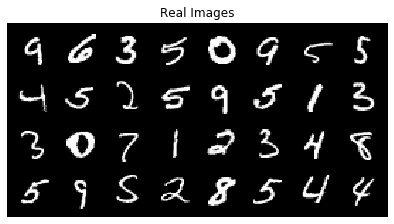

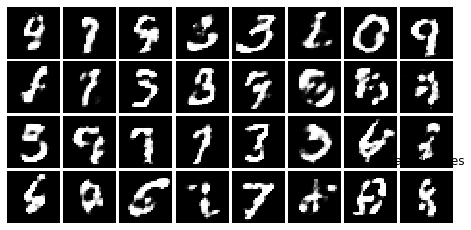

<Figure size 432x288 with 0 Axes>

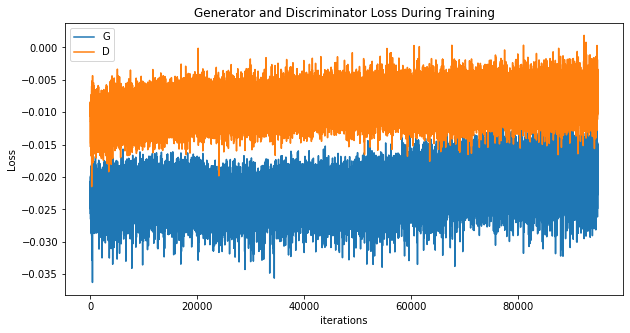

Iter-96000; D_loss: -0.009750418365001678; G_loss: -0.023618312552571297


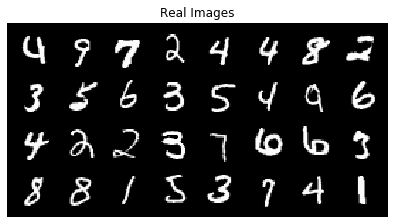

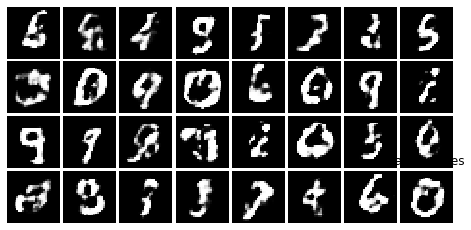

<Figure size 432x288 with 0 Axes>

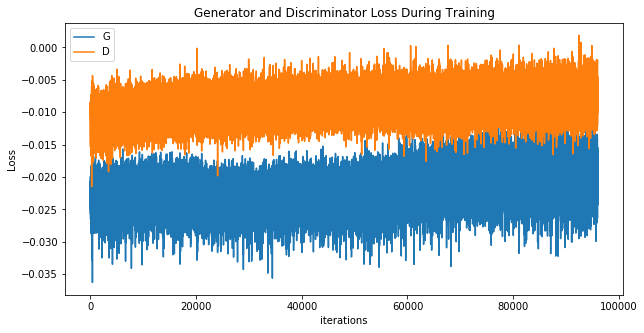

Iter-97000; D_loss: -0.0075827706605196; G_loss: -0.020429883152246475


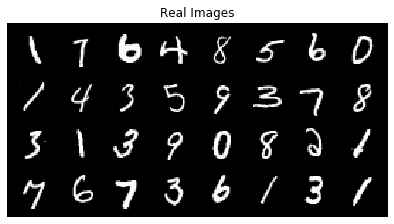

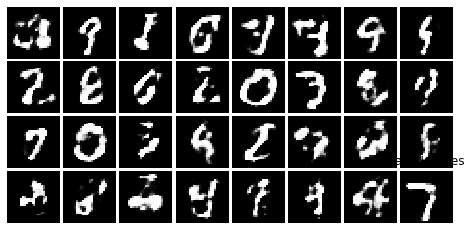

<Figure size 432x288 with 0 Axes>

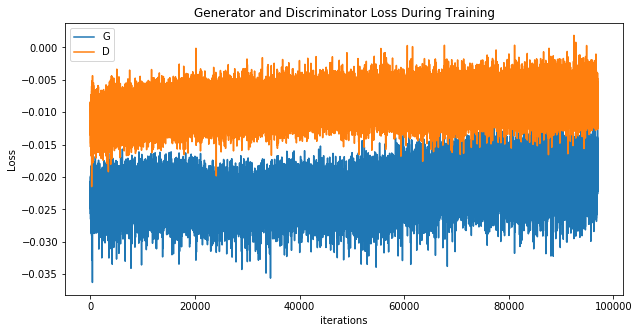

Iter-98000; D_loss: -0.006211118772625923; G_loss: -0.017012204974889755


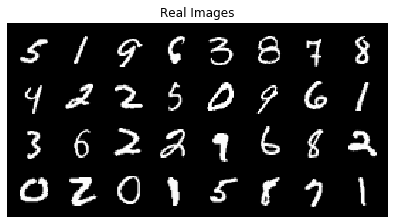

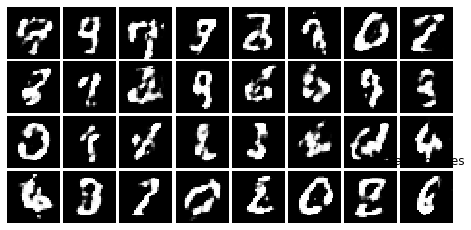

<Figure size 432x288 with 0 Axes>

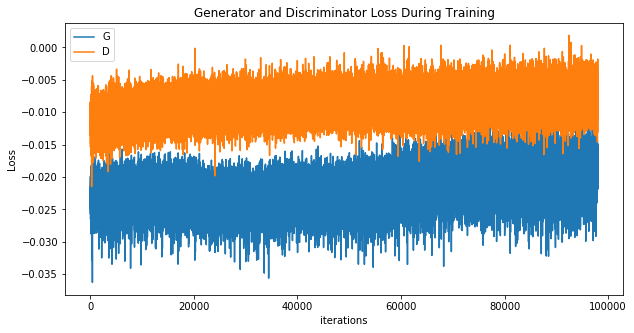

Iter-99000; D_loss: -0.003452831879258156; G_loss: -0.012192160822451115


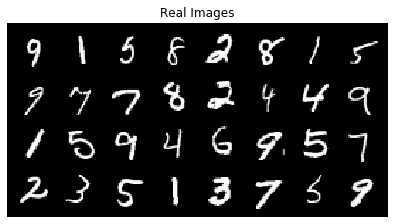

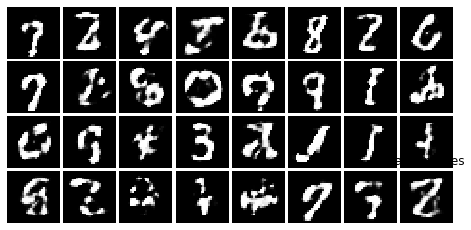

<Figure size 432x288 with 0 Axes>

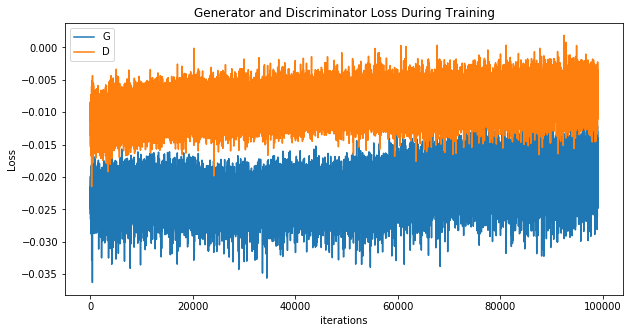

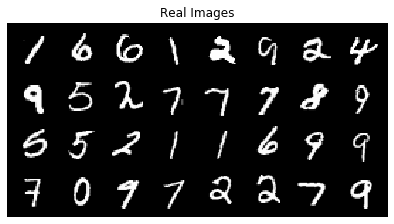

In [0]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
for it in range(100000):
    i = 1
    for _ in range(5):
        # Sample data
        z = Variable(torch.randn(mb_size, z_dim))
        X, _ = mnist.train.next_batch(mb_size)
        X = Variable(torch.from_numpy(X))

        # Dicriminator forward-loss-backward-update
        G_sample = G(z)
        D_real = D(X)
        D_fake = D(G_sample)

        D_loss = -(torch.mean(D_real) - torch.mean(D_fake))
        if i == 5:
          D_losses.append(D_loss.item())

        D_loss.backward()
        D_solver.step()

        # Weight clipping
        for p in D.parameters():
            p.data.clamp_(-0.01, 0.01)

        # Housekeeping - reset gradient
        reset_grad()
        i=i+1

    # Generator forward-loss-backward-update
    X, _ = mnist.train.next_batch(mb_size)
    X = Variable(torch.from_numpy(X))
    z = Variable(torch.randn(mb_size, z_dim))

    G_sample = G(z)
    D_fake = D(G_sample)

    G_loss = -torch.mean(D_fake)
    G_losses.append(G_loss.item())

    G_loss.backward()
    G_solver.step()

    # Housekeeping - reset gradient
    reset_grad()

    # Print and plot every now and then
    if it % 1000 == 0:
        print('Iter-{}; D_loss: {}; G_loss: {}'
              .format(it, D_loss.data.numpy(), G_loss.data.numpy()))

        samples = G(z).data.numpy()[:64]

        fig = plt.figure(figsize=(8, 8))
        gs = gridspec.GridSpec(8, 8)
        gs.update(wspace=0.05, hspace=0.05)

        for i, sample in enumerate(samples):
            ax = plt.subplot(gs[i])
            plt.axis('off')
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_aspect('equal')
            plt.imshow(sample.reshape(28, 28), cmap='Greys_r')

        if not os.path.exists('out/'):
            os.makedirs('out/')

        plt.title("Fake Images")
        plt.show()
        plt.savefig('out/{}.png'.format(str(cnt).zfill(3)), bbox_inches='tight')
        cnt += 1
        plt.close(fig)
        plt.figure(figsize=(10,5))
        plt.title("Generator and Discriminator Loss During Training")
        plt.plot(G_losses,label="G")
        plt.plot(D_losses,label="D")
        plt.xlabel("iterations")
        plt.ylabel("Loss")
        plt.legend()
        plt.show()

        real_batch = next(iter(train_loader))

        # Plot the real images
        plt.figure(figsize=(15,15))
        plt.subplot(1,2,1)
        plt.axis("off")
        plt.title("Real Images")
        plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))
